<a href="https://colab.research.google.com/github/TeDand/neuromorphic-classification/blob/main/direct_event_classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Notebook Setup

## Hardware Setup

In [ ]:
import tensorflow as tf

gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

if ram_gb < 20:
  print('Not using a high-RAM runtime')
else:
  print('You are using a high-RAM runtime!')

gpu = tf.test.gpu_device_name()
print(gpu)

Tue Jun 21 19:32:31 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   57C    P0    36W / 250W |  15999MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

## Mounting Google Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# NMNIST

## Working with Data


### Helper Functions

In [ ]:
from typing import NamedTuple
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
import seaborn as sns
import pandas as pd

class Event(NamedTuple):
    x_location: int
    y_location: int
    polarity: int
    timestamp: int

def read_events(filepath):
  file = open(filepath, "rb")

  events = []

  # reading 5 bytes (40 bits) at a time
  event = int.from_bytes(file.read(5), byteorder="little", signed=False)

  i = 0
  while event:
    # interpreting binary data
    location_mask = 0b11111111
    x_location = location_mask & event
    y_location = location_mask & (event>>8)
    polarity = 0b1 & (event>>16)
    timestamp_mask = 0b11111111111111111111111
    timestamp = timestamp_mask & (event>>17)

    # appending to list of events
    events.append(Event(x_location, y_location, polarity, timestamp))

    # reading next event
    event = int.from_bytes(file.read(5), byteorder="little", signed=False)
    i += 1

  file.close()
  return events

def visualise_events(event_list):
  off_events = list(filter(lambda event: event.polarity == 0, event_list))
  on_events = list(filter(lambda event: event.polarity == 1, event_list))

  fig = plt.figure(figsize=(8,8))
  ax = fig.add_subplot(111, projection='3d')
  ax.set_xlabel("x_location (pixels)")
  ax.set_ylabel("timestamp (ms)")
  ax.set_zlabel("y_location (pixels)")

  ax.scatter(
      [e.x_location for e in off_events],
      [e.timestamp for e in off_events],
      [e.y_location for e in off_events],
      c="blue",
      label="off events")

  ax.scatter(
      [e.x_location for e in on_events],
      [e.timestamp for e in on_events],
      [e.y_location for e in on_events],
      c="red",
      label="on events")

  ax.legend()
  plt.show()

def segment_events(event_list, segments, visualise):
  sorted_events = sorted(event_list, key=lambda e: e.timestamp, reverse=False)
  timestamp_range = sorted_events[-1].timestamp - sorted_events[0].timestamp
  if visualise:
    print("{0} -> {1} ms = {2} ms".format(sorted_events[0].timestamp, sorted_events[-1].timestamp, timestamp_range))

  segmented_events = []
  for i in range(segments):
    segmented_events.append(list(filter(
        lambda event: event.timestamp < (i+1)*(sorted_events[-1].timestamp/segments)
        and event.timestamp > (i)*(sorted_events[-1].timestamp/segments), events)))
    if i%3 == 1 and visualise == 1:
      visualise_events(segmented_events[-1])

  return segmented_events

def visualise_on_off_events(event_list):
  off_events = list(filter(lambda event: event.polarity == 0, event_list))
  on_events = list(filter(lambda event: event.polarity == 1, event_list))

  fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,5))
  ax1.set_xlabel("x_location (pixels)")
  ax1.set_ylabel("y_location (pixels)")
  ax2.set_xlabel("x_location (pixels)")
  ax2.set_ylabel("y_location (pixels)")

  ax1.set_title("On Events")

  ax1.scatter(
      [e.x_location for e in on_events],
      [e.y_location for e in on_events],
      c="red",
      label="on events")

  ax2.set_title("Off Events")

  ax2.scatter(
      [e.x_location for e in off_events],
      [e.y_location for e in off_events],
      c="blue",
      label="off events")

  ax1.grid()
  ax2.grid()

  plt.show()

def get_intensity(event_list, max_x, max_y):
  off_events = list(filter(lambda event: event.polarity == 0, event_list))
  on_events = list(filter(lambda event: event.polarity == 1, event_list))

  intensity = [[0 for _ in range(max_x + 1)] for _ in range(max_y + 1)]

  for e in on_events:
    intensity[e.x_location][e.y_location] += 1

  for e in off_events:
    intensity[e.x_location][e.y_location] -= 1

  return intensity


def visulaise_intensity_map(event_list, max_x, max_y):
  intensity = get_intensity(event_list, max_x, max_y)

  fig = plt.figure(figsize=(8,6))
  ax = fig.add_subplot(111)
  ax.set_xlabel("x_location (pixels)")
  ax.set_ylabel("y_location (pixels)")

  # Create a dataset
  df = pd.DataFrame(intensity)

  # Default heatmap
  ax = sns.heatmap(df)
  ax.invert_yaxis()
  # p1 = sns.heatmap(df)
  plt.show()

### Downloading Data

In [ ]:
# Loading N-MNIST dataset
import zipfile
!wget -O "MNIST_testing.zip" "https://data.mendeley.com/public-files/datasets/468j46mzdv/files/05a4d654-7e03-4c15-bdfa-9bb2bcbea494/file_downloaded"
with zipfile.ZipFile("MNIST_testing.zip", 'r') as zip_ref:
    zip_ref.extractall("/content/NMNIST")
!rm "MNIST_testing.zip"
!wget -O "MNIST_training.zip" "https://data.mendeley.com/public-files/datasets/468j46mzdv/files/39c25547-014b-4137-a934-9d29fa53c7a0/file_downloaded"
with zipfile.ZipFile("MNIST_training.zip", 'r') as zip_ref:
    zip_ref.extractall("/content/NMNIST")
!rm "MNIST_training.zip"

--2022-05-28 15:35:13--  https://data.mendeley.com/public-files/datasets/468j46mzdv/files/05a4d654-7e03-4c15-bdfa-9bb2bcbea494/file_downloaded
Resolving data.mendeley.com (data.mendeley.com)... 162.159.130.86, 162.159.133.86
Connecting to data.mendeley.com (data.mendeley.com)|162.159.130.86|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://md-datasets-public-files-prod.s3.eu-west-1.amazonaws.com/a99d0fee-a95b-4231-ad22-988fdb0a2411 [following]
--2022-05-28 15:35:14--  https://md-datasets-public-files-prod.s3.eu-west-1.amazonaws.com/a99d0fee-a95b-4231-ad22-988fdb0a2411
Resolving md-datasets-public-files-prod.s3.eu-west-1.amazonaws.com (md-datasets-public-files-prod.s3.eu-west-1.amazonaws.com)... 52.218.106.40
Connecting to md-datasets-public-files-prod.s3.eu-west-1.amazonaws.com (md-datasets-public-files-prod.s3.eu-west-1.amazonaws.com)|52.218.106.40|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 169674850 (162M) [applicati

In [ ]:
# !cp -r /content/NMNIST /content/drive/MyDrive

Each example is a separate binary file consisting of a list of events. Each event occupies 40 bits as described below:

- bit 39 - 32: Xaddress (in pixels)

- bit 31 - 24: Yaddress (in pixels)

- bit 23: Polarity (0 for OFF, 1 for ON)

- bit 22 - 0: Timestamp (in microseconds)

### Visualising Data

In [ ]:
events = read_events("/content/NMNIST/Train/0/00002.bin")

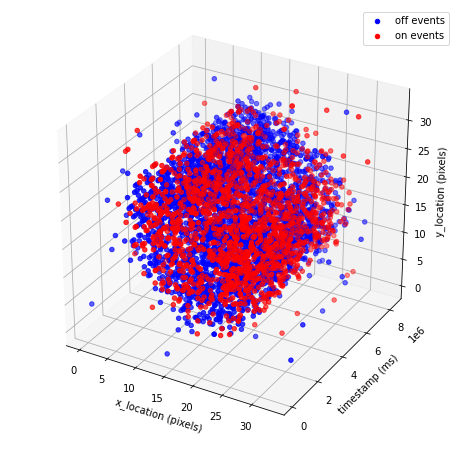

In [ ]:
visualise_events(events)

In [ ]:
from keras.datasets import mnist
import numpy as np

(x_train, y_train), (x_test, y_test) = mnist.load_data()

train_filter = np.where((y_train == 0 ))
x_train_0, y_train_0 = x_train[train_filter], y_train[train_filter]

11501568/11490434 [==============================] - 0s 0us/step


Train: X=(60000, 28, 28), y=(60000,)
Test: X=(10000, 28, 28), y=(10000,)


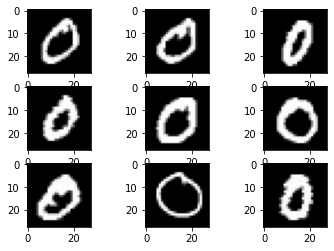

In [ ]:
from matplotlib import pyplot

# summarize loaded dataset
print('Train: X=%s, y=%s' % (x_train.shape, y_train.shape))
print('Test: X=%s, y=%s' % (x_test.shape, y_test.shape))

# plot first few images
for i in range(9):
	# define subplot
	pyplot.subplot(330 + 1 + i)
	# plot raw pixel data
	pyplot.imshow(x_train_0[i], cmap=pyplot.get_cmap('gray'))

# show the figure
pyplot.show()

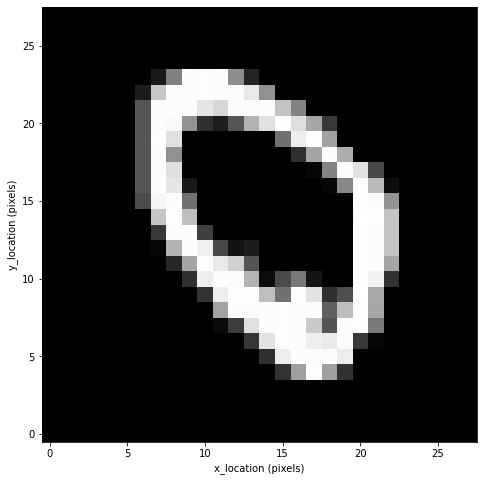

In [ ]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(111)
ax.set_xlabel("x_location (pixels)")
ax.set_ylabel("y_location (pixels)")

ax.imshow(x_train_0[0], cmap=pyplot.get_cmap('gray'))

plt.gca().invert_yaxis()

plt.show()

1537 -> 8386624 ms = 8385087 ms


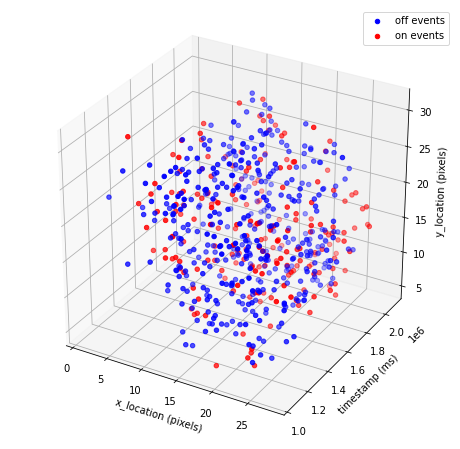

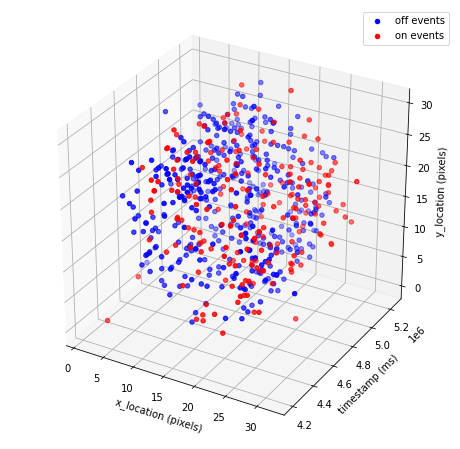

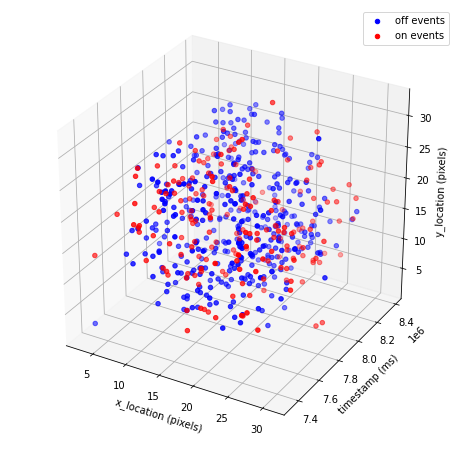

In [ ]:
segmented_events = segment_events(events, 8, True)

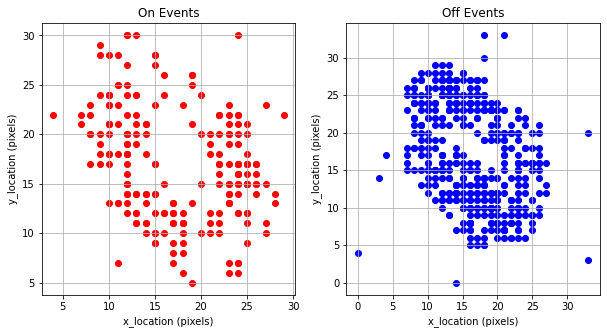

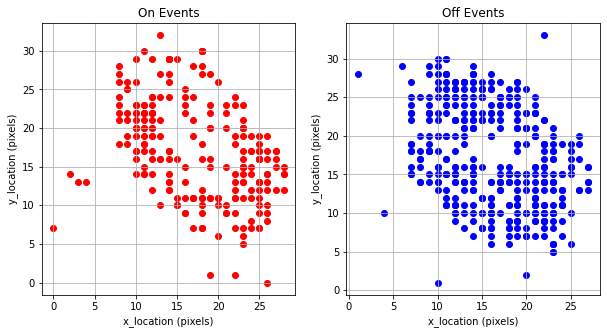

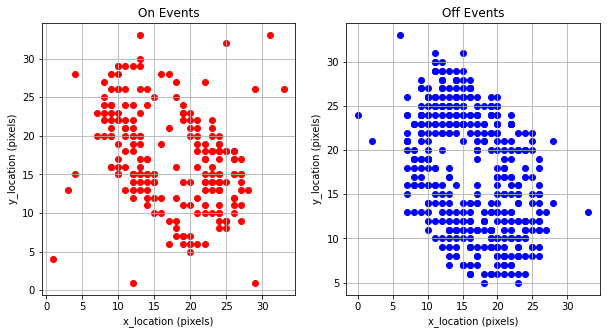

In [ ]:
for i in range(len(segmented_events)):
  if i%3 == 0:
    visualise_on_off_events(segmented_events[i])

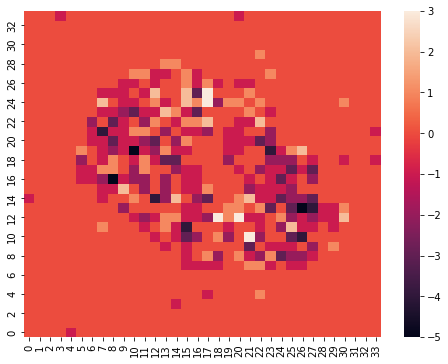

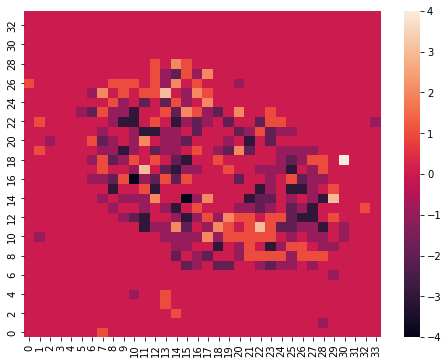

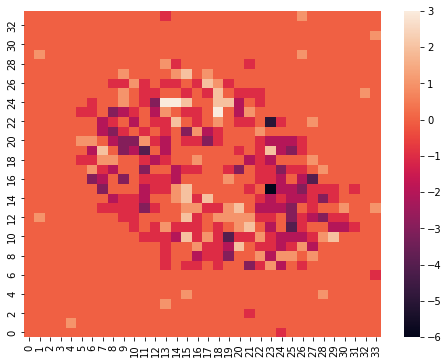

In [ ]:
max_x = max(events, key=lambda e: e.x_location).x_location
max_y = max(events, key=lambda e: e.y_location).y_location

for i in range(len(segmented_events)):
  if i%3 == 0:
    visulaise_intensity_map(segmented_events[i], max_x, max_y)

### Preprocessing Data

In [ ]:
from keras.utils import np_utils
import os
import pickle

max_no = 10000/20

x_train = []
y_train = []
print('Loading training samples')
for act_class in range(10):
  # print(' class {0}'.format(act_class))
  # directory = "/content/drive/MyDrive/NMNIST/Train/{0}".format(act_class)
  directory = "/content/NMNIST/Train/{0}/".format(act_class)
  # iterate over files in
  # that directory
  count = 0
  for sample in os.listdir(directory):
      f = os.path.join(directory, sample)
      # checking if it is a file
      if os.path.isfile(f) and count < 6 * max_no:
          # print(f)
          events = read_events(f)
          max_x = 33
          max_y = 33
          segmented_events = segment_events(events, 8, False)
          intensity_maps = []
          for segment in segmented_events:
            intensity_maps.append(get_intensity(segment, max_x, max_y))
          x_train.append(intensity_maps)
          y_train.append(np_utils.to_categorical(act_class, 10))
      else:
        pass
      count = count + 1
  # print('   {0} samples loaded'.format(number_of_samples))

x_test = []
y_test = []
print('Loading testing samples')
for act_class in range(10):
  # print(' class {0}'.format(act_class))
  # directory = "/content/drive/MyDrive/NMNIST/Test/{0}".format(act_class)
  directory = "/content/NMNIST/Test/{0}/".format(act_class)
  # iterate over files in
  # that directory
  count = 0
  for sample in os.listdir(directory):
      f = os.path.join(directory, sample)
      # checking if it is a file
      if os.path.isfile(f) and count < max_no:
          # print(f)
          events = read_events(f)
          max_x = 33
          max_y = 33
          segmented_events = segment_events(events, 8, False)
          intensity_maps = []
          for segment in segmented_events:
            intensity_maps.append(get_intensity(segment, max_x, max_y))
          x_test.append(intensity_maps)
          y_test.append(np_utils.to_categorical(act_class, 10))
      else:
        pass
      count = count + 1
  # print('   {0} samples loaded'.format(number_of_samples))

x_train = np.array(x_train)
y_train = np.array(y_train)
x_test = np.array(x_test)
y_test = np.array(y_test)
train_events = {"x": x_train, "y": y_train}
test_events = {"x": x_test, "y": y_test}
all_events = {"train": train_events, "test": test_events}

Loading training samples
Loading testing samples


### Saving Data

In [ ]:
open_file = open("/content/drive/MyDrive/NMNIST/event_list.pkl", "wb")
pickle.dump(all_events, open_file)
open_file.close()

### Loading Data

In [ ]:
import pickle
import numpy as np

open_file = open("/content/drive/MyDrive/NMNIST/event_list.pkl", "rb")
events = pickle.load(open_file)
open_file.close()

x_train = events["train"]["x"]
x_train = x_train.reshape(x_train.shape[0], x_train.shape[1], x_train.shape[2], x_train.shape[3], 1)
train_set = x_train.astype('float32')
train_set -= np.mean(x_train)
train_set /= np.max(x_train)

x_test = events["test"]["x"]
x_test = x_test.reshape(x_test.shape[0], x_test.shape[1], x_test.shape[2], x_test.shape[3], 1)
test_set = x_test.astype('float32')
test_set -= np.mean(x_train)
test_set /= np.max(x_train)

x_train = train_set
x_test = test_set

y_train = events["train"]["y"]
y_test = events["test"]["y"]

print('Image shape: {0}'.format(x_train.shape[1:]))
print('y_train/y_test shape: {0}'.format(y_train.shape))
print('Total number of training samples: {0}'.format(x_train.shape[0]))
print('Total number of test samples: {0}'.format(x_test.shape[0]))

Image shape: (8, 34, 34, 1)
y_train/y_test shape: (30000, 10)
Total number of training samples: 30000
Total number of test samples: 5000


## Classification Networks

### Hyper-parameter Testing

In [ ]:
scores = []
histories = []

for i in range(20):
  print("testing with {0} layers in the network".format(i+1))

  # Define here your architecture

  kernal = 3
  neurons = 16

  model = Sequential()
  model.add(Conv2D(neurons, (kernal,kernal), padding='same', input_shape=x_train.shape[1:]))
  model.add(Activation('relu'))
  for j in range(i):
    model.add(Conv2D(neurons, (kernal,kernal), padding='same'))
    model.add(Activation('relu'))
  model.add(Flatten())
  model.add(Dense(10))
  model.add(Activation('softmax'))

  # . . .


  # initiate RMSprop optimizer
  opt = RMSprop(lr=0.0001, decay=1e-6)


  model.compile(loss='categorical_crossentropy', optimizer=opt, metrics=['accuracy'])

  history = model.fit(x_train, y_train, batch_size=32, epochs=20)
  histories.append(history)

  score = model.evaluate(x_test, y_test, verbose=0)
  print('Test loss:', score[0])
  print('Test accuracy:', score[1])
  scores.append([score[0], score[1]])


In [ ]:
import pickle

for i in range(1, len(histories) + 1):

  with open('/content/drive/MyDrive/layerTests/trainHistoryDict{0}'.format(i), 'wb') as file_pi:
    pickle.dump(histories[i-1].history, file_pi)

with open("/content/drive/MyDrive/layerTests/scoresList.txt", "wb") as fp:
  pickle.dump(scores, fp)

Text(0.5, 0, 'Epoch')

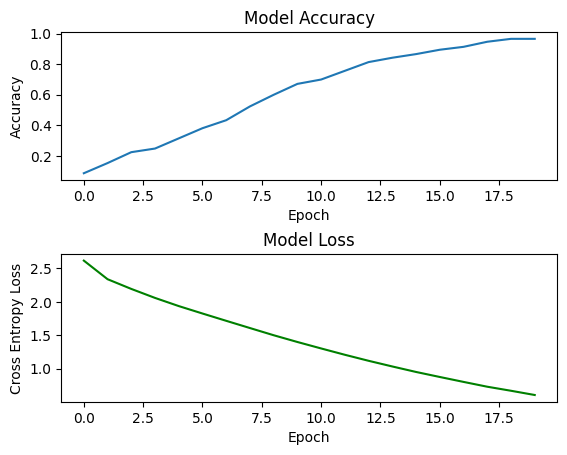

In [ ]:
import pickle
import matplotlib.pyplot as plt; plt.rcdefaults()
import numpy as np
import matplotlib.pyplot as plt

history = pickle.load(open('/content/drive/MyDrive/layerTests/trainHistoryDict1', "rb"))

fig, axes = plt.subplots(2,1)
axes[0].plot(history['accuracy'])
axes[0].set_title('Model Accuracy')
axes[0].set_ylabel('Accuracy')
axes[0].set_xlabel('Epoch')

fig.subplots_adjust(hspace=0.5)

axes[1].plot(history['loss'], 'g')
axes[1].set_title('Model Loss')
axes[1].set_ylabel('Cross Entropy Loss')
axes[1].set_xlabel('Epoch')

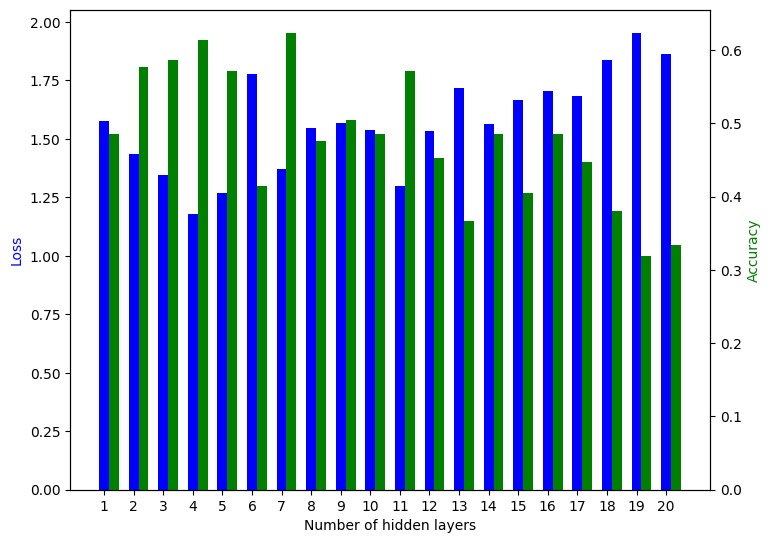

In [ ]:
import matplotlib.pyplot as plt; plt.rcdefaults()
import numpy as np
import matplotlib.pyplot as plt
import pickle

with open("/content/drive/MyDrive/layerTests/scoresList.txt", "rb") as fp:
  scores = pickle.load(fp)

# for i in range(len(scores)):
#   print('Test loss:', scores[i][0])
#   print('Test accuracy:', scores[i][1])

t = np.array(scores)
loss = t[:,0]
acc = t[:,1]
x = np.arange(1,len(scores) + 1)

# fig , ax = plt.subplots(nrows = 1, ncols = 2, figsize=(8,6))

# #Plotting on the 1st axes
# ax[0].grid()
# ax[0].bar(x, loss, color = 'blue')

# #Plotting on the last axes
# ax[1].grid()
# ax[1].bar(x, acc, color = 'red')

width = 1/3

fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
ax2 = ax.twinx()
ax.bar(x, loss, color = 'b', width = width)
ax2.bar(x + width, acc, color = 'g', width = width)
ax.set_xticks(x)
ax.set_xlabel("Number of hidden layers")
ax.set_ylabel("Loss", color = 'b')
ax2.set_ylabel("Accuracy", color = 'g')
# ax.bar(x + 0.50, data[2], color = 'r', width = 0.25)

# print(history.history['accuracy'])

plt.show()

In [ ]:
scores = []
histories = []

for i in range(2, 20):
  print("testing with a kernel size of {0}x{0} ".format(i))

  # Define here your architecture

  kernal = i
  neurons = 16

  model = Sequential()
  model.add(Conv2D(neurons, (kernal,kernal), padding='same', input_shape=x_train.shape[1:]))
  model.add(Activation('relu'))
  for j in range(3):
    model.add(Conv2D(neurons, (kernal,kernal), padding='same'))
    model.add(Activation('relu'))
  model.add(Flatten())
  model.add(Dense(10))
  model.add(Activation('softmax'))

  # . . .


  # initiate RMSprop optimizer
  opt = RMSprop(lr=0.0001, decay=1e-6)


  model.compile(loss='categorical_crossentropy', optimizer=opt, metrics=['accuracy'])

  history = model.fit(x_train, y_train, batch_size=32, epochs=20)
  histories.append(history)

  score = model.evaluate(x_test, y_test, verbose=0)
  print('Test loss:', score[0])
  print('Test accuracy:', score[1])
  scores.append([score[0], score[1]])


In [ ]:
import pickle

for i in range(1, len(histories) + 1):

  with open('/content/drive/MyDrive/kernelTests/trainHistoryDict{0}'.format(i+3), 'wb') as file_pi:
    pickle.dump(histories[i-1].history, file_pi)

with open("/content/drive/MyDrive/kernelTests/scoresList.txt", "wb") as fp:
  pickle.dump(scores, fp)

In [ ]:
import matplotlib.pyplot as plt; plt.rcdefaults()
import numpy as np
import matplotlib.pyplot as plt
import pickle

with open("/content/drive/MyDrive/kernelTests/scoresList.txt", "rb") as fp:
  scores = pickle.load(fp)

# for i in range(len(scores)):
#   print('Test loss:', scores[i][0])
#   print('Test accuracy:', scores[i][1])

t = np.array(scores)
loss = t[:,0]
acc = t[:,1]
x = np.arange(3,len(scores) + 3)

# fig , ax = plt.subplots(nrows = 1, ncols = 2, figsize=(8,6))

# #Plotting on the 1st axes
# ax[0].grid()
# ax[0].bar(x, loss, color = 'blue')

# #Plotting on the last axes
# ax[1].grid()
# ax[1].bar(x, acc, color = 'red')

width = 1/3

fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
ax2 = ax.twinx()
ax.bar(x, loss, color = 'b', width = width)
ax2.bar(x + width, acc, color = 'g', width = width)
ax.set_xticks(x)
ax.set_xlabel("Kernel Size")
ax.set_ylabel("Loss", color = 'b')
ax2.set_ylabel("Accuracy", color = 'g')
# ax.bar(x + 0.50, data[2], color = 'r', width = 0.25)

# print(history.history['accuracy'])

plt.show()

In [ ]:
scores = []
histories = []

for i in range(1, 11):
  print("testing with {0} neurons in each layer ".format(2**i))

  # Define here your architecture

  kernal = 10
  neurons = 2**i

  model = Sequential()
  model.add(Conv2D(neurons, (kernal,kernal), padding='same', input_shape=x_train.shape[1:]))
  model.add(Activation('relu'))
  for j in range(3):
    model.add(Conv2D(neurons, (kernal,kernal), padding='same'))
    model.add(Activation('relu'))
  model.add(Flatten())
  model.add(Dense(10))
  model.add(Activation('softmax'))

  # . . .


  # initiate RMSprop optimizer
  opt = RMSprop(lr=0.0001, decay=1e-6)


  model.compile(loss='categorical_crossentropy', optimizer=opt, metrics=['accuracy'])

  history = model.fit(x_train, y_train, batch_size=32, epochs=20)
  histories.append(history)

  score = model.evaluate(x_test, y_test, verbose=0)
  print('Test loss:', score[0])
  print('Test accuracy:', score[1])
  scores.append([score[0], score[1]])


### Custom Conv3D Network

In [ ]:
from keras.preprocessing.image import ImageDataGenerator
import numpy as np
from keras.models import Sequential
from keras.layers.core import Dense, Dropout, Activation, Flatten
from keras.layers.convolutional import Convolution3D, MaxPooling3D
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.optimizers import Adam
from keras.utils import np_utils
from keras.callbacks import TensorBoard, EarlyStopping
from sklearn.model_selection import train_test_split
import keras

# Initialing the Training Parameters
batch_size = 32
nb_classes = 10
nb_epoch = 120

# Number of convolutional filters to use at each layer
nb_filters = 32
# Level of pooling to perform at each layer (POOL x POOL)
nb_pool = 2
# Level of convolution to perform at each layer (CONV x CONV)
nb_conv = 5

# Defining the 3D Convolution Neural Network model
model = Sequential()
model.add(Convolution3D(nb_filters,kernel_size=nb_conv,input_shape=x_train.shape[1:], activation='relu',padding='same'))
model.add(BatchNormalization())
model.add(Convolution3D(nb_filters,kernel_size=nb_conv,input_shape=x_train.shape[1:], activation='relu',padding='same'))
model.add(BatchNormalization())
model.add(MaxPooling3D(pool_size=nb_pool,padding='same'))

model.add(Dropout(0.25))

model.add(Convolution3D(nb_filters*2,kernel_size=nb_conv,activation='relu',padding='same'))
model.add(BatchNormalization())
model.add(MaxPooling3D(pool_size=nb_pool,padding='same'))

model.add(Dropout(0.25))

model.add(Convolution3D(nb_filters*4,kernel_size=nb_conv,activation='relu',padding='same'))
model.add(BatchNormalization())
model.add(Convolution3D(nb_filters*4,kernel_size=nb_conv,activation='relu',padding='same'))
model.add(BatchNormalization())
model.add(MaxPooling3D(pool_size=nb_pool,padding='same'))

model.add(Dropout(0.25))

model.add(Flatten())
model.add(Dense(128,kernel_initializer = 'he_normal',activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.5))
model.add(Dense(nb_classes,kernel_initializer = 'he_normal'))
model.add(Activation('softmax'))

opt=Adam(lr=0.0001)

model.summary()

# Compile the model
model.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])

# Spliting the dataset for testing and training
x_train_new, x_val_new, y_train_new, y_val_new =  train_test_split(x_train, y_train, test_size=0.2, random_state=4)

logdir = "logs/scalars/conv3d_nmnist"

# Training  the model along with creating callbacks to tensorboard for graphical visualization of training process
tbcallback = keras.callbacks.TensorBoard(log_dir=logdir, histogram_freq=0, write_graph=True, write_images=True)
early_stopping = EarlyStopping(monitor='val_accuracy', patience=4, restore_best_weights=True)
hist = model.fit(x_train_new, y_train_new, validation_data=(x_val_new,y_val_new),
          batch_size=batch_size,epochs = nb_epoch,shuffle=True,verbose=1,callbacks=[tbcallback, early_stopping])

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv3d_10 (Conv3D)          (None, 8, 34, 34, 32)     4032      
                                                                 
 batch_normalization_12 (Bat  (None, 8, 34, 34, 32)    128       
 chNormalization)                                                
                                                                 
 conv3d_11 (Conv3D)          (None, 8, 34, 34, 32)     128032    
                                                                 
 batch_normalization_13 (Bat  (None, 8, 34, 34, 32)    128       
 chNormalization)                                                
                                                                 
 max_pooling3d_6 (MaxPooling  (None, 4, 17, 17, 32)    0         
 3D)                                                             
                                                      

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/120
750/750 [==============================] - 80s 106ms/step - loss: 0.7301 - accuracy: 0.7684 - val_loss: 0.2484 - val_accuracy: 0.9195
Epoch 2/120
750/750 [==============================] - 81s 107ms/step - loss: 0.2710 - accuracy: 0.9172 - val_loss: 0.1357 - val_accuracy: 0.9527
Epoch 3/120
750/750 [==============================] - 80s 107ms/step - loss: 0.1905 - accuracy: 0.9414 - val_loss: 0.1159 - val_accuracy: 0.9600
Epoch 4/120
750/750 [==============================] - 81s 107ms/step - loss: 0.1401 - accuracy: 0.9574 - val_loss: 0.1181 - val_accuracy: 0.9605
Epoch 5/120
750/750 [==============================] - 81s 107ms/step - loss: 0.1260 - accuracy: 0.9614 - val_loss: 0.0866 - val_accuracy: 0.9713
Epoch 6/120
750/750 [==============================] - 81s 107ms/step - loss: 0.1000 - accuracy: 0.9693 - val_loss: 0.0784 - val_accuracy: 0.9725
Epoch 7/120
750/750 [==============================] - 80s 107ms/step - loss: 0.0867 - accuracy: 0.9733 - val_loss: 0.0903 -

In [ ]:
from keras.models import load_model

model.save('/content/drive/MyDrive/models/conv3d_nmnist.h5')  # creates a HDF5 file 'my_model.h5'
# del model  # deletes the existing model

#### Results

In [ ]:
from keras.models import load_model

model = load_model('/content/drive/MyDrive/models/conv3d_nmnist.h5')

In [ ]:
score = model.evaluate(x_test, y_test)
y_pred = model.predict(x_test)

print('Test loss:', score[0])
print('Test accuracy:', score[1])

157/157 [==============================] - 4s 27ms/step - loss: 0.0608 - accuracy: 0.9824
Test loss: 0.06082009896636009
Test accuracy: 0.9824000000953674


In [ ]:
from sklearn.metrics import classification_report

print(classification_report(y_test.argmax(axis=1), y_pred.argmax(axis=1)))

              precision    recall  f1-score   support

           0       0.98      0.99      0.99       500
           1       0.99      0.99      0.99       500
           2       0.98      0.99      0.98       500
           3       0.99      0.98      0.98       500
           4       0.98      0.99      0.99       500
           5       0.98      0.99      0.99       500
           6       0.99      0.98      0.99       500
           7       0.99      0.97      0.98       500
           8       0.95      0.98      0.96       500
           9       0.99      0.95      0.97       500

    accuracy                           0.98      5000
   macro avg       0.98      0.98      0.98      5000
weighted avg       0.98      0.98      0.98      5000



[Text(0, 0.5, '0'),
 Text(0, 1.5, '1'),
 Text(0, 2.5, '2'),
 Text(0, 3.5, '3'),
 Text(0, 4.5, '4'),
 Text(0, 5.5, '5'),
 Text(0, 6.5, '6'),
 Text(0, 7.5, '7'),
 Text(0, 8.5, '8'),
 Text(0, 9.5, '9')]

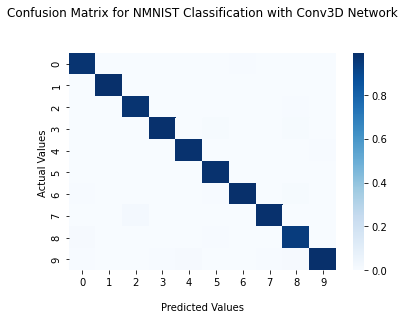

In [ ]:
from sklearn.metrics import confusion_matrix
import numpy as np
from keras.utils import np_utils
import seaborn as sns

#Create confusion matrix and normalizes it over predicted (columns)
result = confusion_matrix(y_test.argmax(axis=1), y_pred.argmax(axis=1), normalize='pred')

ax = sns.heatmap(result, annot=False, cmap='Blues')

ax.set_title('Confusion Matrix for NMNIST Classification with Conv3D Network\n\n');
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels([i for i in range(10)])
ax.yaxis.set_ticklabels([i for i in range(10)])

In [ ]:
import tensorflow as tf

# Load the TensorBoard notebook extension
%load_ext tensorboard

logdir = "logs/NMNIST_Conv3D/20220528-182446"

%tensorboard --logdir logdir

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 428), started 0:02:52 ago. (Use '!kill 428' to kill it.)

<IPython.core.display.Javascript object>

### Custom Conv2D Networks

DOESN'T MAKE SENSE

In [ ]:
import tensorflow as tf
tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)
from keras.models import Sequential
from keras.layers import Dense, Activation
from keras.utils import np_utils
from keras.datasets import cifar10
from tensorflow.keras.optimizers import RMSprop
from keras.layers import Conv2D, MaxPooling2D, Flatten

kernal = 6
layers = 6

model = Sequential()
model.add(Conv2D(128, (2,2), padding='same', input_shape=x_train.shape[2:]))
model.add(Activation('relu'))

model.add(MaxPooling2D(pool_size=(2,2)))

model.add(Conv2D(256, (2,2), padding='same'))
model.add(Activation('relu'))

model.add(MaxPooling2D(pool_size=(2,2)))

model.add(Conv2D(512, (2,2), padding='same'))
model.add(Activation('relu'))

model.add(MaxPooling2D(pool_size=(2,2)))

# model.add(Conv2D(64, (9,9), padding='same'))
# model.add(Activation('relu'))

# model.add(MaxPooling2D(pool_size=(2,2)))

model.add(Flatten())

# model.add(Dense(512))
# model.add(Activation('relu'))

model.add(Dense(256))
model.add(Activation('relu'))

model.add(Dense(10))
model.add(Activation('softmax'))

# . . .


# initiate RMSprop optimizer
opt = RMSprop(lr=0.0001, decay=1e-6)

model.summary()

# model.compile(loss='categorical_crossentropy', optimizer=opt, metrics=['accuracy'])

# history = model.fit(x_train, y_train, batch_size=32, epochs=20)

# score = model.evaluate(x_test, y_test, verbose=0)
# print('Test loss:', score[0])
# print('Test accuracy:', score[1])

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 34, 34, 128)       640       
                                                                 
 activation_3 (Activation)   (None, 34, 34, 128)       0         
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 17, 17, 128)      0         
 2D)                                                             
                                                                 
 conv2d_4 (Conv2D)           (None, 17, 17, 256)       131328    
                                                                 
 activation_4 (Activation)   (None, 17, 17, 256)       0         
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 8, 8, 256)        0         
 2D)                                                  

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/rmsprop.py:130: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(RMSprop, self).__init__(name, **kwargs)


In [ ]:
from keras.layers import Dense, Activation, Dropout, Flatten, Conv2D, MaxPooling2D, Lambda
from keras.models import Sequential
from tensorflow.keras.optimizers import Adam

model = Sequential()

# Resize input image
model.add(Lambda(lambda x: tf.compat.v1.image.resize_images(x, (224, 224)), input_shape=x_train.shape[1:]))

# 1st Convolutional Layer
model.add(Conv2D(filters=96, kernel_size=(11,11), strides=(4,4), padding='valid'))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2,2), strides=(2,2), padding='valid'))

# 2nd Convolutional Layer
model.add(Conv2D(filters=256, kernel_size=(11,11), strides=(1,1), padding='valid'))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2,2), strides=(2,2), padding='valid'))

# 3rd Convolutional Layer
model.add(Conv2D(filters=384, kernel_size=(3,3), strides=(1,1), padding='valid'))
model.add(Activation('relu'))

# 4th Convolutional Layer
model.add(Conv2D(filters=384, kernel_size=(3,3), strides=(1,1), padding='valid'))
model.add(Activation('relu'))

# 5th Convolutional Layer
model.add(Conv2D(filters=256, kernel_size=(3,3), strides=(1,1), padding='valid'))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2,2), strides=(2,2), padding='valid'))

# Passing it to a Fully Connected layer
model.add(Flatten())

# 1st Fully Connected Layer
model.add(Dense(4096, input_shape=(224*224*3,)))
model.add(Activation('relu'))
# Add Dropout to prevent overfitting
model.add(Dropout(0.4))

# 2nd Fully Connected Layer
model.add(Dense(4096))
model.add(Activation('relu'))
# Add Dropout
model.add(Dropout(0.4))

# 3rd Fully Connected Layer
model.add(Dense(10))
model.add(Activation('softmax'))

In [ ]:
model.compile(loss='categorical_crossentropy',
              optimizer=Adam(lr=1e-4),
              metrics=['accuracy'])

model.fit(x_train, y_train, batch_size=32, epochs=20)

Epoch 1/20


/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


7/7 [==============================] - 69s 10s/step - loss: 2.3194 - accuracy: 0.0952
Epoch 2/20
7/7 [==============================] - 58s 7s/step - loss: 2.2441 - accuracy: 0.1143
Epoch 3/20
7/7 [==============================] - 52s 7s/step - loss: 1.8568 - accuracy: 0.3667
Epoch 4/20
7/7 [==============================] - 51s 7s/step - loss: 1.4636 - accuracy: 0.5048
Epoch 5/20
7/7 [==============================] - 51s 7s/step - loss: 1.2328 - accuracy: 0.5667
Epoch 6/20
7/7 [==============================] - 51s 7s/step - loss: 0.9231 - accuracy: 0.6762
Epoch 7/20
7/7 [==============================] - 51s 7s/step - loss: 0.6813 - accuracy: 0.7667
Epoch 8/20
7/7 [==============================] - 51s 7s/step - loss: 0.6260 - accuracy: 0.7857
Epoch 9/20
7/7 [==============================] - 51s 7s/step - loss: 0.5123 - accuracy: 0.8190
Epoch 10/20
7/7 [==============================] - 50s 7s/step - loss: 0.3402 - accuracy: 0.8905
Epoch 11/20
7/7 [==============================] 

In [ ]:
score = model.evaluate(x_test, y_test)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

7/7 [==============================] - 15s 2s/step - loss: 1.1968 - accuracy: 0.7429
Test loss: 1.196768045425415
Test accuracy: 0.7428571581840515


In [ ]:
train_input = x_train.reshape(x_train.shape[0], x_train.shape[1], x_train.shape[2], x_train.shape[3], 1)

print('Image shape: {0}'.format(train_input.shape))
print('y_train/y_test shape: {0}'.format(y_train.shape))

Image shape: (30000, 8, 34, 34, 1)
y_train/y_test shape: (30000, 10)


### Conv2D LTSM Network

First you should know, method of solving video classification task is better suit for Convolutional RNN than LSTM or any RNN Cell, just as CNN is better suit for image classification task than MLP.

Yes, you are right with the concept of CONVLSTM2D.
CONVLSTM2D architecture combines gating of LSTM with 2D convolutions.

As you have mentioned, CONVLSTM layers will do a similar task to LSTM but instead of matrix multiplications, it does convolution operations and retains the input dimensions.

Another different approach would be that the images pass through the convolution layer and the result will be a flattened 1D array and this will be the input to the LSTM layers with a set of features over time.

https://arxiv.org/pdf/1506.04214v1.pdf

Beware you should reorder your data to the shape (samples, timesteps, width, height, channels) before feed in above model (i.e not like np.reshape, but like np.moveaxis), in your case the shape should be (120, 60, 192, 192, 1), then you can split your 120 video to batchs and feed to model

In [ ]:
import tensorflow as tf
from tensorflow.keras import models, layers
from tensorflow.keras.optimizers import Adam
from keras.callbacks import EarlyStopping
from keras.callbacks import TensorBoard
import keras
from sklearn.model_selection import train_test_split

timesteps = 8
width = 34
height = 34
channels = 1
action_num = 10

model = models.Sequential(
    [
        layers.Input(
            shape=(timesteps, width, height, channels)
        ),
        layers.ConvLSTM2D(
            filters=64, kernel_size=(3, 3), padding="same", return_sequences=True, dropout=0.1, recurrent_dropout=0.1
        ),
        layers.MaxPool3D(
            pool_size=(1, 2, 2), strides=(1, 2, 2), padding="same"
        ),
        layers.BatchNormalization(),
        layers.ConvLSTM2D(
            filters=32, kernel_size=(3, 3), padding="same", return_sequences=True, dropout=0.1, recurrent_dropout=0.1
        ),
        layers.MaxPool3D(
            pool_size=(1, 2, 2), strides=(1, 2, 2), padding="same"
        ),
        layers.BatchNormalization(),
        layers.ConvLSTM2D(
            filters=16, kernel_size=(3, 3), padding="same", return_sequences=False, dropout=0.1, recurrent_dropout=0.1
        ),
        layers.MaxPool2D(
            pool_size=(2, 2), strides=(2, 2), padding="same"
        ),
        layers.BatchNormalization(),
        layers.Flatten(),
        layers.Dense(256, activation='relu'),
        layers.Dense(action_num, activation='softmax')
    ]
)

model.compile(loss='categorical_crossentropy',
              optimizer=Adam(lr=1e-4),
              metrics=['accuracy'])

model.summary()

early_stopping = EarlyStopping(monitor='val_accuracy', patience=4, restore_best_weights=True)
logdir = "logs/NMNIST_ConvLSTM"
# Training  the model along with creating callbacks to tensorboard for graphical visualization of training process
tbcallback = keras.callbacks.TensorBoard(log_dir=logdir, histogram_freq=0, write_graph=True, write_images=True)

# Spliting the dataset for testing and training
x_train_new, x_val_new, y_train_new, y_val_new = train_test_split(x_train, y_train, test_size=0.2, random_state=4)
history = model.fit(x_train_new, y_train_new, batch_size=32, epochs=40, validation_data=(x_val_new, y_val_new), callbacks=[early_stopping, tbcallback])

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d (ConvLSTM2D)    (None, 8, 34, 34, 64)     150016    
                                                                 
 max_pooling3d (MaxPooling3D  (None, 8, 17, 17, 64)    0         
 )                                                               
                                                                 
 batch_normalization (BatchN  (None, 8, 17, 17, 64)    256       
 ormalization)                                                   
                                                                 
 conv_lstm2d_1 (ConvLSTM2D)  (None, 8, 17, 17, 32)     110720    
                                                                 
 max_pooling3d_1 (MaxPooling  (None, 8, 9, 9, 32)      0         
 3D)                                                             
                                                        

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/40
750/750 [==============================] - 196s 236ms/step - loss: 0.5143 - accuracy: 0.8439 - val_loss: 0.2504 - val_accuracy: 0.9212
Epoch 2/40
750/750 [==============================] - 177s 236ms/step - loss: 0.2003 - accuracy: 0.9383 - val_loss: 0.1740 - val_accuracy: 0.9420
Epoch 3/40
750/750 [==============================] - 178s 237ms/step - loss: 0.1458 - accuracy: 0.9556 - val_loss: 0.1486 - val_accuracy: 0.9525
Epoch 4/40
750/750 [==============================] - 178s 238ms/step - loss: 0.1210 - accuracy: 0.9622 - val_loss: 0.1359 - val_accuracy: 0.9568
Epoch 5/40
750/750 [==============================] - 178s 238ms/step - loss: 0.1021 - accuracy: 0.9670 - val_loss: 0.1162 - val_accuracy: 0.9597
Epoch 6/40
750/750 [==============================] - 180s 240ms/step - loss: 0.0875 - accuracy: 0.9724 - val_loss: 0.1376 - val_accuracy: 0.9528
Epoch 7/40
750/750 [==============================] - 180s 240ms/step - loss: 0.0773 - accuracy: 0.9752 - val_loss: 0.1274 -

In [ ]:
from keras.models import load_model

model.save('/content/drive/MyDrive/models/conv_lstm_nmnist.h5')  # creates a HDF5 file 'my_model.h5'
# del model  # deletes the existing model

#### Results

In [ ]:
from keras.models import load_model

model = load_model('/content/drive/MyDrive/models/conv_lstm_nmnist.h5')

In [ ]:
score = model.evaluate(x_test, y_test)
y_pred = model.predict(x_test)

print('Test loss:', score[0])
print('Test accuracy:', score[1])

157/157 [==============================] - 10s 66ms/step - loss: 0.1003 - accuracy: 0.9678
Test loss: 0.10032026469707489
Test accuracy: 0.9678000211715698


In [ ]:
from sklearn.metrics import classification_report

print(classification_report(y_test.argmax(axis=1), y_pred.argmax(axis=1)))

              precision    recall  f1-score   support

           0       0.98      0.98      0.98       500
           1       0.99      1.00      0.99       500
           2       0.95      0.98      0.97       500
           3       0.99      0.94      0.96       500
           4       1.00      0.95      0.97       500
           5       0.96      0.98      0.97       500
           6       0.98      0.99      0.99       500
           7       0.97      0.96      0.96       500
           8       0.94      0.96      0.95       500
           9       0.92      0.95      0.94       500

    accuracy                           0.97      5000
   macro avg       0.97      0.97      0.97      5000
weighted avg       0.97      0.97      0.97      5000



[Text(0, 0.5, '0'),
 Text(0, 1.5, '1'),
 Text(0, 2.5, '2'),
 Text(0, 3.5, '3'),
 Text(0, 4.5, '4'),
 Text(0, 5.5, '5'),
 Text(0, 6.5, '6'),
 Text(0, 7.5, '7'),
 Text(0, 8.5, '8'),
 Text(0, 9.5, '9')]

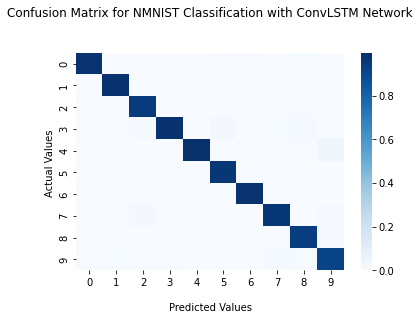

In [ ]:
from sklearn.metrics import confusion_matrix
import numpy as np
from keras.utils import np_utils
import seaborn as sns

#Create confusion matrix and normalizes it over predicted (columns)
result = confusion_matrix(y_test.argmax(axis=1), y_pred.argmax(axis=1), normalize='pred')

ax = sns.heatmap(result, annot=False, cmap='Blues')

ax.set_title('Confusion Matrix for NMNIST Classification with ConvLSTM Network\n\n');
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels([i for i in range(10)])
ax.yaxis.set_ticklabels([i for i in range(10)])

### Custom LTSM Network 1

In [ ]:
from keras.layers import Conv2D, MaxPooling2D, Flatten

def build_convnet(shape=(34, 34, 1)):
  model = Sequential()
  model.add(Conv2D(128, (2,2), padding='same', input_shape=shape))
  model.add(Activation('relu'))

  model.add(MaxPooling2D(pool_size=(2,2)))

  model.add(Conv2D(256, (2,2), padding='same'))
  model.add(Activation('relu'))

  model.add(MaxPooling2D(pool_size=(2,2)))

  model.add(Conv2D(512, (2,2), padding='same'))
  model.add(Activation('relu'))

  model.add(MaxPooling2D(pool_size=(2,2)))

  # model.add(Conv2D(64, (9,9), padding='same'))
  # model.add(Activation('relu'))

  # model.add(MaxPooling2D(pool_size=(2,2)))

  model.add(Flatten())

  # model.add(Dense(512))
  # model.add(Activation('relu'))
  return model

In [ ]:
from keras.layers.core import Dense, Activation, Dropout
from keras.layers.recurrent import LSTM
from keras.models import Sequential
from keras.layers import TimeDistributed, GRU

def action_model(shape=(8, 34, 34, 1), nbout=10):
    # Create our convnet with (34, 34, 1) input shape
    print("done")
    convnet = build_convnet(shape[1:])

    # then create our final model
    model = Sequential()
    # add the convnet with (8, 34, 34, 1) shape
    model.add(TimeDistributed(convnet, input_shape=shape))
    # here, you can also use GRU or LSTM
    model.add(GRU(64))
    # and finally, we make a decision network
    model.add(Dense(1024, activation='relu'))
    model.add(Dropout(.5))
    model.add(Dense(512, activation='relu'))
    model.add(Dropout(.5))
    model.add(Dense(128, activation='relu'))
    model.add(Dropout(.5))
    model.add(Dense(64, activation='relu'))
    model.add(Dense(nbout, activation='softmax'))
    return model

In [ ]:
from keras.callbacks import EarlyStopping
from keras.callbacks import TensorBoard
import keras
from sklearn.model_selection import train_test_split
from tensorflow.keras.optimizers import Adam

model = action_model(x_train.shape[1:], 10)
opt = Adam(lr=0.0001, decay=1e-6)

model.summary()

model.compile(loss='categorical_crossentropy', optimizer=opt, metrics=['accuracy'])

early_stopping = EarlyStopping(monitor='val_accuracy', patience=4, restore_best_weights=True)
logdir = "logs/NMNIST_ConvLSTM"
# Training  the model along with creating callbacks to tensorboard for graphical visualization of training process
tbcallback = keras.callbacks.TensorBoard(log_dir=logdir, histogram_freq=0, write_graph=True, write_images=True)

# Spliting the dataset for testing and training
x_train_new, x_val_new, y_train_new, y_val_new =  train_test_split(x_train, y_train, test_size=0.2, random_state=4)
history = model.fit(x_train_new, y_train_new, batch_size=32, epochs=60, validation_data=(x_val_new, y_val_new), callbacks=[early_stopping, tbcallback])

done
Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 time_distributed (TimeDistr  (None, 8, 8192)          656768    
 ibuted)                                                         
                                                                 
 gru (GRU)                   (None, 64)                1585536   
                                                                 
 dense_2 (Dense)             (None, 1024)              66560     
                                                                 
 dropout (Dropout)           (None, 1024)              0         
                                                                 
 dense_3 (Dense)             (None, 512)               524800    
                                                                 
 dropout_1 (Dropout)         (None, 512)               0         
                                                 

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/60
750/750 [==============================] - 50s 62ms/step - loss: 1.3176 - accuracy: 0.5175 - val_loss: 0.4772 - val_accuracy: 0.8357
Epoch 2/60
750/750 [==============================] - 47s 62ms/step - loss: 0.4732 - accuracy: 0.8530 - val_loss: 0.3206 - val_accuracy: 0.9067
Epoch 3/60
750/750 [==============================] - 47s 63ms/step - loss: 0.3163 - accuracy: 0.9081 - val_loss: 0.2561 - val_accuracy: 0.9200
Epoch 4/60
750/750 [==============================] - 48s 64ms/step - loss: 0.2454 - accuracy: 0.9316 - val_loss: 0.2304 - val_accuracy: 0.9358
Epoch 5/60
750/750 [==============================] - 48s 64ms/step - loss: 0.2072 - accuracy: 0.9428 - val_loss: 0.1696 - val_accuracy: 0.9508
Epoch 6/60
750/750 [==============================] - 48s 64ms/step - loss: 0.1834 - accuracy: 0.9492 - val_loss: 0.1718 - val_accuracy: 0.9497
Epoch 7/60
750/750 [==============================] - 48s 64ms/step - loss: 0.1585 - accuracy: 0.9557 - val_loss: 0.1823 - val_accuracy:

In [ ]:
from keras.models import load_model

model.save('/content/drive/MyDrive/models/custom_conv_lstm_nmnist.h5')  # creates a HDF5 file 'my_model.h5'
# del model  # deletes the existing model

#### Results

In [ ]:
from keras.models import load_model

model = load_model('/content/drive/MyDrive/models/custom_conv_lstm_nmnist.h5')

In [ ]:
score = model.evaluate(x_test, y_test, verbose=0)
y_pred = model.predict(x_test)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

Test loss: 0.12411434203386307
Test accuracy: 0.9700000286102295


In [ ]:
from sklearn.metrics import classification_report

print(classification_report(y_test.argmax(axis=1), y_pred.argmax(axis=1)))

              precision    recall  f1-score   support

           0       0.98      0.99      0.98       500
           1       0.99      1.00      1.00       500
           2       0.97      0.98      0.98       500
           3       0.93      0.98      0.96       500
           4       0.99      0.97      0.98       500
           5       0.99      0.97      0.98       500
           6       0.98      0.98      0.98       500
           7       0.98      0.94      0.96       500
           8       0.94      0.95      0.95       500
           9       0.94      0.94      0.94       500

    accuracy                           0.97      5000
   macro avg       0.97      0.97      0.97      5000
weighted avg       0.97      0.97      0.97      5000



[Text(0, 0.5, '0'),
 Text(0, 1.5, '1'),
 Text(0, 2.5, '2'),
 Text(0, 3.5, '3'),
 Text(0, 4.5, '4'),
 Text(0, 5.5, '5'),
 Text(0, 6.5, '6'),
 Text(0, 7.5, '7'),
 Text(0, 8.5, '8'),
 Text(0, 9.5, '9')]

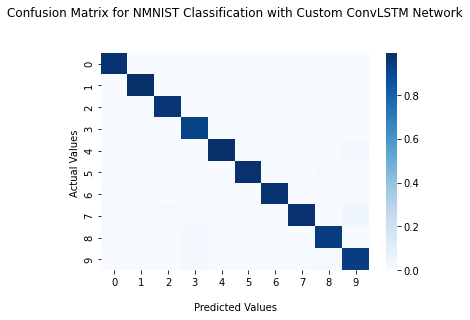

In [ ]:
from sklearn.metrics import confusion_matrix
import numpy as np
from keras.utils import np_utils
import seaborn as sns

#Create confusion matrix and normalizes it over predicted (columns)
result = confusion_matrix(y_test.argmax(axis=1), y_pred.argmax(axis=1), normalize='pred')

ax = sns.heatmap(result, annot=False, cmap='Blues')

ax.set_title('Confusion Matrix for NMNIST Classification with Custom ConvLSTM Network\n\n');
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels([i for i in range(10)])
ax.yaxis.set_ticklabels([i for i in range(10)])

### Custom LTSM Network 2

In [ ]:
from keras.applications.mobilenet import MobileNet
from keras.models import Sequential
from keras.layers import GlobalMaxPool2D

def build_mobilenet(shape=(34, 34, 1)):
    model = MobileNet(
        include_top=False,
        input_shape=shape,
        weights=None)
    # # Keep 9 layers to train
    # trainable = 9
    # for layer in model.layers[:-trainable]:
    #     layer.trainable = False
    # for layer in model.layers[-trainable:]:
    #     layer.trainable = True
    for layer in model.layers:
      layer.trainable = True
    output = GlobalMaxPool2D()
    return Sequential([model, output])

In [ ]:
from keras.layers.core import Dense, Activation, Dropout
from keras.layers.recurrent import LSTM
from keras.models import Sequential
from keras.layers import TimeDistributed, GRU

def action_model2(shape=(8, 34, 34, 1), nbout=10):
    # Create mobilenet with (34, 34, 1) input shape
    print("done")
    mobilenet = build_mobilenet(shape[1:])

    # then create our final model
    model = Sequential()
    # add the convnet with (8, 34, 34, 1) shape
    model.add(TimeDistributed(mobilenet, input_shape=shape))
    # here, you can also use GRU or LSTM
    model.add(GRU(64))
    # and finally, we make a decision network
    model.add(Dense(1024, activation='relu'))
    model.add(Dropout(.5))
    model.add(Dense(512, activation='relu'))
    model.add(Dropout(.5))
    model.add(Dense(128, activation='relu'))
    model.add(Dropout(.5))
    model.add(Dense(64, activation='relu'))
    model.add(Dense(nbout, activation='softmax'))
    return model

In [ ]:
train_input = x_train.reshape(x_train.shape[0], x_train.shape[1], x_train.shape[2], x_train.shape[3], 1)
model = action_model2(train_input.shape[1:], 10)
opt = RMSprop(lr=0.0001, decay=1e-6)

model.summary()

model.compile(loss='categorical_crossentropy', optimizer=opt, metrics=['accuracy'])

history = model.fit(train_input, y_train, batch_size=32, epochs=20)

score = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

done
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 time_distributed (TimeDistr  (None, 8, 1024)          3228288   
 ibuted)                                                         
                                                                 
 gru (GRU)                   (None, 64)                209280    
                                                                 
 dense (Dense)               (None, 1024)              66560     
                                                                 
 dropout (Dropout)           (None, 1024)              0         
                                                                 
 dense_1 (Dense)             (None, 512)               524800    
                                                                 
 dropout_1 (Dropout)         (None, 512)               0         
                                                 

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/rmsprop.py:130: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(RMSprop, self).__init__(name, **kwargs)


Epoch 1/20
7/7 [==============================] - 31s 3s/step - loss: 2.3263 - accuracy: 0.1429
Epoch 2/20
7/7 [==============================] - 21s 3s/step - loss: 2.3143 - accuracy: 0.0810
Epoch 3/20
7/7 [==============================] - 21s 3s/step - loss: 2.3083 - accuracy: 0.1095
Epoch 4/20
7/7 [==============================] - 22s 3s/step - loss: 2.3079 - accuracy: 0.1143
Epoch 5/20
7/7 [==============================] - 21s 3s/step - loss: 2.2958 - accuracy: 0.1190
Epoch 6/20
7/7 [==============================] - 21s 3s/step - loss: 2.3022 - accuracy: 0.0952
Epoch 7/20
7/7 [==============================] - 21s 3s/step - loss: 2.3284 - accuracy: 0.0762
Epoch 8/20
7/7 [==============================] - 21s 3s/step - loss: 2.2949 - accuracy: 0.1000
Epoch 9/20
7/7 [==============================] - 22s 3s/step - loss: 2.2882 - accuracy: 0.1286
Epoch 10/20
7/7 [==============================] - 21s 3s/step - loss: 2.2672 - accuracy: 0.1619
Epoch 11/20
7/7 [======================

In [ ]:
print(x_train.shape)
print(train_input.shape)

(210, 8, 34, 34)
(210, 8, 34, 34, 1)


In [ ]:
from keras.models import load_model

model.save('/content/drive/MyDrive/models/RNN1.h5')  # creates a HDF5 file 'my_model.h5'
# del model  # deletes the existing model

In [ ]:
# Load a compiled model identical to the previous one
model = load_model('/content/drive/MyDrive/models/RNN1.h5')
score = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

Test loss: 2.159344434738159
Test accuracy: 0.4809523820877075


### De-Noising Networks

In [ ]:
# Import libaries (provided)
import imageio
import numpy as np
import matplotlib.pyplot as plt
import scipy
import scipy.signal
import math
import time

In [ ]:
import os
from keras.utils import np_utils

max_no = 1

x_train = []
y_train = []
for act_class in range(1):
  directory = "/content/drive/MyDrive/NMNIST/Train/{0}".format(act_class)
  count = 0
  for sample in os.listdir(directory):
      f = os.path.join(directory, sample)
      if os.path.isfile(f) and count < max_no:
          events = read_events(f)
          max_x = 33
          max_y = 33
          segmented_events = segment_events(events, 4, False)
          intensity_maps = []
          for segment in segmented_events:
            intensity_maps.append(get_intensity(segment, max_x, max_y))
          x_train.append(intensity_maps)
          y_train.append(np_utils.to_categorical(act_class, 10))
      else:
        pass
      count = count + 1

x_train = np.array(x_train)
y_train = np.array(y_train)
# x_test = np.array(x_test)
# y_test = np.array(y_test)

In [ ]:
print(x_train.shape)

(1, 4, 34, 34)


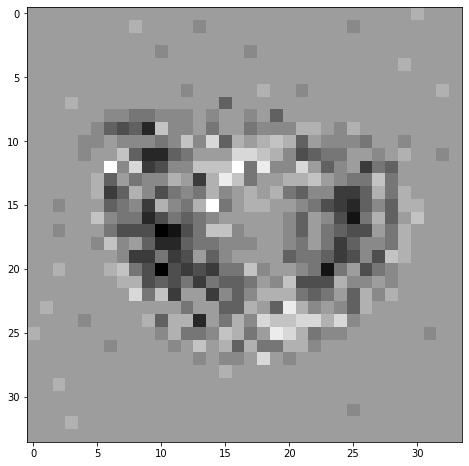

In [ ]:
# Read the image (provided)
image = x_train[0][0]
plt.imshow(image, cmap='gray')
plt.gcf().set_size_inches(10, 8)

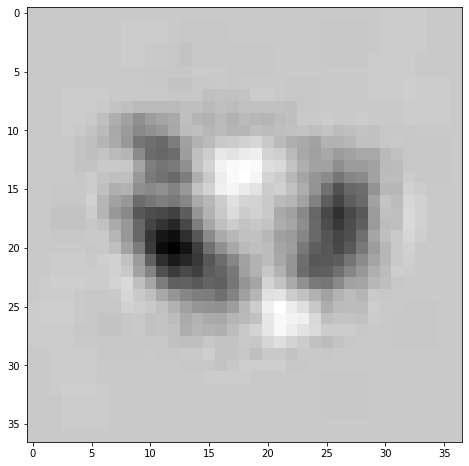

In [ ]:
def smoothing_filter(image, n):
  # Design the filter h
  h = np.full((n, n), 1/(n*n))

  # Convolve the corrupted image with h using scipy.signal.convolve2d function
  image_filtered = scipy.signal.convolve2d(image, h)
  return image_filtered

# Display the filtering result (provided)
image_filtered = smoothing_filter(image, 4)
plt.imshow(image_filtered, cmap='gray')
plt.gcf().set_size_inches(10, 8)

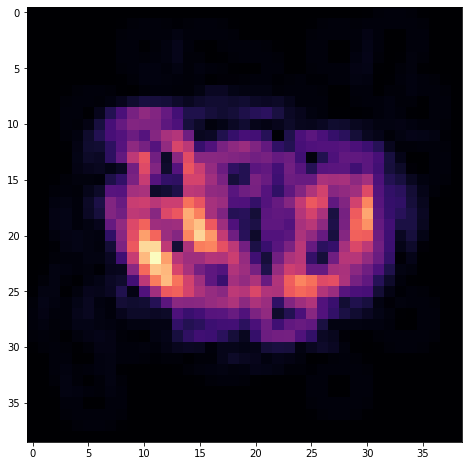

In [ ]:
def detect_edges(image):
  # Design the Sobel filters
  h_sobel_x = np.array([[-1, 0, 1],
                      [-2, 0, 2],
                      [-1, 0, 1]])
  h_sobel_y = np.array([[-1, -2, -1],
                      [0, 0, 0],
                      [1, 2, 1]])

  # Sobel filtering
  sobel_x = scipy.signal.convolve2d(image, h_sobel_x)
  sobel_y = scipy.signal.convolve2d(image, h_sobel_y)

  # Calculate the gradient magnitude

  sobel_mag = np.hypot(sobel_x, sobel_y)
  return sobel_mag

# Display the magnitude image (provided)
sobel_mag = detect_edges(image_filtered)
plt.imshow(sobel_mag, cmap='magma')
plt.gcf().set_size_inches(10, 8)

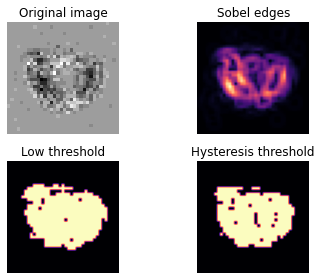

In [ ]:
from skimage import filters
import copy

def threshold(sobel_mag, low, high):
  lowt = copy.deepcopy(sobel_mag)
  for i in range(sobel_mag.shape[0]):
    for j in range(sobel_mag.shape[1]):
      if sobel_mag[i][j] > low:
        lowt[i][j] = 255
      else:
        lowt[i][j] = 0

  hight = copy.deepcopy(sobel_mag)
  for i in range(sobel_mag.shape[0]):
    for j in range(sobel_mag.shape[1]):
      if sobel_mag[i][j] > high:
        hight[i][j] = 255
      else:
        hight[i][j] = 0

  hyst = filters.apply_hysteresis_threshold(sobel_mag, low, high)
  for i in range(hyst.shape[0]):
    for j in range(hyst.shape[1]):
      if hyst[i][j] > 0:
        hyst[i][j] = 255
      else:
        hyst[i][j] = 0

  return lowt, hyst+hight

lowt, hyst = threshold(sobel_mag, 1, 1.5)
fig, ax = plt.subplots(nrows=2, ncols=2)
ax[0, 0].imshow(image, cmap='gray')
ax[0, 0].set_title('Original image')

ax[0, 1].imshow(sobel_mag, cmap='magma')
ax[0, 1].set_title('Sobel edges')

ax[1, 0].imshow(lowt, cmap='magma')
ax[1, 0].set_title('Low threshold')

ax[1, 1].imshow(hyst, cmap='magma')
ax[1, 1].set_title('Hysteresis threshold')

for a in ax.ravel():
    a.axis('off')

plt.tight_layout()

plt.show()

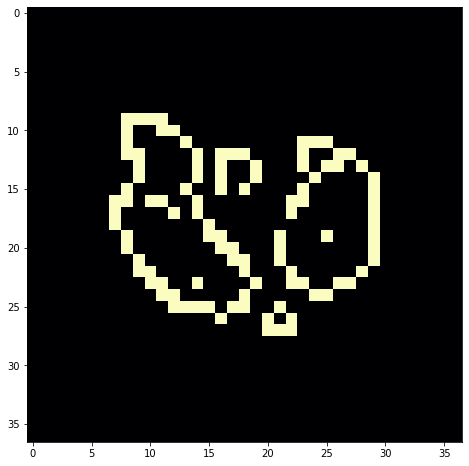

In [ ]:
import cv2
from matplotlib import pyplot as plt

image_filtered_copy = np.uint8(image_filtered)
canny_mag = cv2.Canny(image=image_filtered_copy, threshold1=1, threshold2=1.5)
plt.imshow(canny_mag, cmap='magma')
plt.gcf().set_size_inches(10, 8)

In [ ]:
videos = []
for i in range(x_train.shape[0]):
  video = []
  for j in range(x_train.shape[1]):
    image = x_train[i][j]
    image_filtered = smoothing_filter(image, 4)
    # sobel_mag = detect_edges(image_filtered)
    # _, hyst = threshold(sobel_mag, 1, 1.5)
    image_filtered_copy = np.uint8(image_filtered)
    canny_mag = cv2.Canny(image=image_filtered_copy, threshold1=1, threshold2=1.5)
    video.append(canny_mag)
  videos.append(video)

videos = np.array(videos)
# videos = videos.reshape(videos.shape[0], videos.shape[1], videos.shape[2], videos.shape[3], 1)

In [ ]:
print(videos.shape)

(1, 4, 37, 37)


In [ ]:
import os
from PIL import Image as im

def gif(filename, array):
    fname, _ = os.path.splitext(filename)
    filename = fname + '.gif'

    images = []
    for i in range(array.shape[0]):
      image = im.fromarray(array[i])
      images.append(image.rotate(angle=-90))

    images[0].save(filename, save_all=True, append_images=images[1:], loop=0)
    # return clip

gif("test", videos[0])

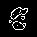

In [ ]:
import IPython
from IPython.display import Image
Image(open('test.gif','rb').read(), width=720)

# DVS128 Gesture
https://gitlab.com/inivation/dv/dv-python#open-a-recording-made-with-dv

## Working with Data

### Saving Data

In [ ]:
!rm -rf /content/datasets
!mkdir /content/datasets
!mkdir /content/datasets/DVS128Gesture
!unzip -q /content/drive/MyDrive/DVS128Gesture/'DVS  Gesture dataset.zip' -d /content/datasets/DVS128Gesture
!mv /content/datasets/DVS128Gesture/'DVS  Gesture dataset' /content/datasets/DVS128Gesture/download

In [ ]:
!pip -q install spikingjelly
from spikingjelly.datasets.dvs128_gesture import DVS128Gesture

root_dir = "/content/datasets/DVS128Gesture"
train_set = DVS128Gesture(root_dir, train=True, data_type='frame', frames_number=20,split_by='number')
test_set = DVS128Gesture(root_dir, train=False, data_type='frame', frames_number=20,split_by='number')

The [/content/datasets/DVS128Gesture/download] directory for saving downloaded files already exists, check files...
Mkdir [/content/datasets/DVS128Gesture/extract].
Extract [/content/datasets/DVS128Gesture/download/DvsGesture.tar.gz] to [/content/datasets/DVS128Gesture/extract].
Mkdir [/content/datasets/DVS128Gesture/events_np].
Start to convert the origin data from [/content/datasets/DVS128Gesture/extract] to [/content/datasets/DVS128Gesture/events_np] in np.ndarray format.
Mkdir [('/content/datasets/DVS128Gesture/events_np/train', '/content/datasets/DVS128Gesture/events_np/test').
Mkdir ['4', '10', '8', '5', '9', '7', '3', '6', '1', '2', '0'] in [/content/datasets/DVS128Gesture/events_np/train] and ['4', '10', '8', '5', '9', '7', '3', '6', '1', '2', '0'] in [/content/datasets/DVS128Gesture/events_np/test].
Start the ThreadPoolExecutor with max workers = [4].
Start to split [/content/datasets/DVS128Gesture/extract/DvsGesture/user01_led.aedat] to samples.
Start to split [/content/datas

In [ ]:
import pickle
import shutil

open_file = open("/content/DVS_train.pkl", "wb")
pickle.dump(train_set, open_file)
open_file.close()

open_file = open("/content/DVS_test.pkl", "wb")
pickle.dump(test_set, open_file)
open_file.close()

shutil.make_archive("DVS128Gesture", 'zip', "/content/datasets/DVS128Gesture/frames_number_20_split_by_number/")

!mv /content/DVS_train.pkl /content/drive/MyDrive/DVS128Gesture
!mv /content/DVS_test.pkl /content/drive/MyDrive/DVS128Gesture
!mv DVS128Gesture.zip /content/drive/MyDrive/DVS128Gesture

### Loading Data

In [ ]:
!rm -rf /content/datasets
!mkdir /content/datasets
!mkdir /content/datasets/DVS128Gesture
!mkdir /content/datasets/DVS128Gesture/frames_number_20_split_by_number
!unzip -q /content/drive/MyDrive/DVS128Gesture/DVS128Gesture.zip -d /content/datasets/DVS128Gesture/frames_number_20_split_by_number
!cp /content/drive/MyDrive/DVS128Gesture/DVS_train.pkl /content/DVS_train.pkl
!cp /content/drive/MyDrive/DVS128Gesture/DVS_test.pkl /content/DVS_test.pkl

In [ ]:
import pickle
!pip -q install spikingjelly
from spikingjelly.datasets.dvs128_gesture import DVS128Gesture

open_file = open("/content/DVS_train.pkl", "rb")
train_set = pickle.load(open_file)
open_file.close()

open_file = open("/content/DVS_test.pkl", "rb")
test_set = pickle.load(open_file)
open_file.close()

0


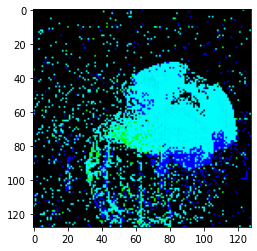

1


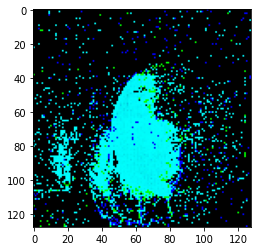

2


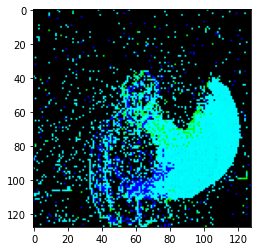

3


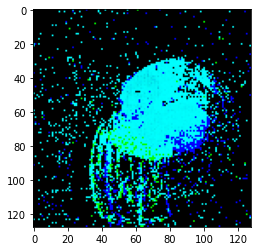

4


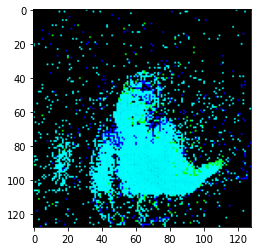

5


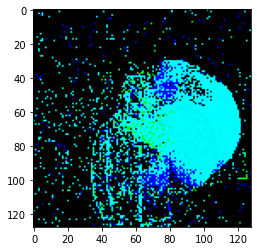

6


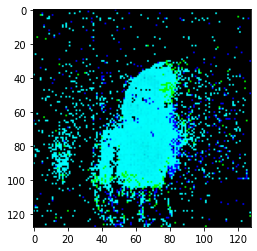

7


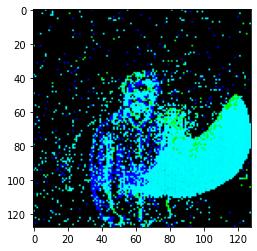

8


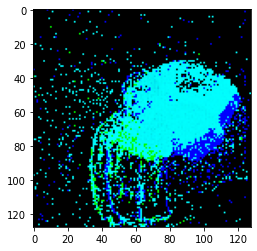

9


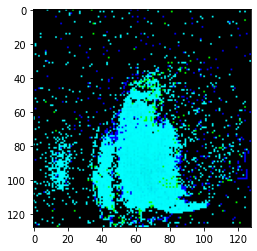

10


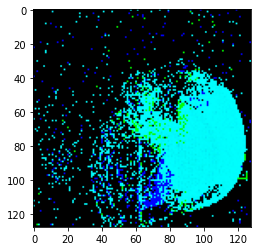

11


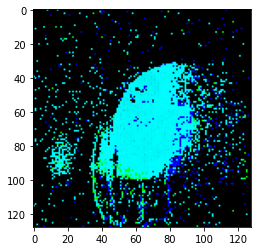

12


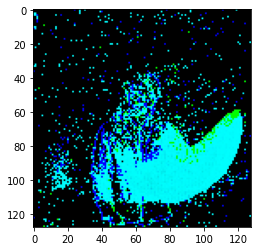

13


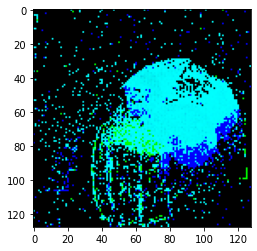

14


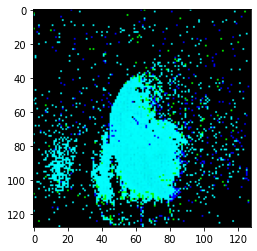

15


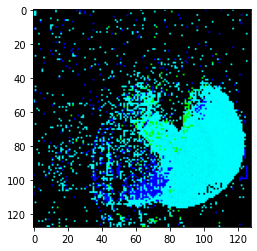

16


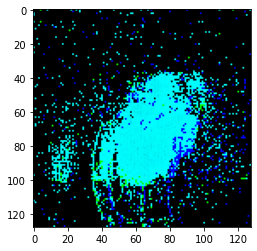

17


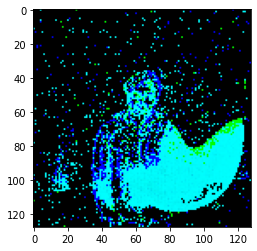

18


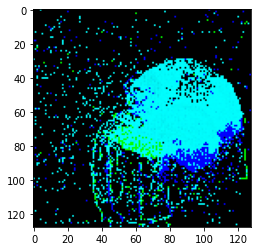

19


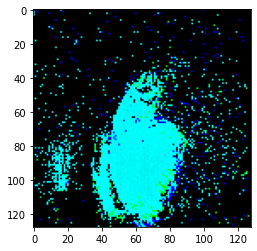

In [ ]:
import torch
from torchvision import transforms
from matplotlib import pyplot as plt

x, y = train_set[600]
to_img = transforms.ToPILImage()

img_tensor = torch.zeros([x.shape[0], 3, x.shape[2], x.shape[3]])
img_tensor[:, 1] = torch.from_numpy(x)[:, 0]
img_tensor[:, 2] = torch.from_numpy(x)[:, 1]

for t in range(img_tensor.shape[0]):
    print(t)
    plt.imshow(to_img(img_tensor[t]))
    plt.pause(0.01)

In [ ]:
import numpy as np
from keras.utils import np_utils

x_train = [frames for frames, _ in train_set]
y_train = [label for _, label in train_set]
x_test = [frames for frames, _ in test_set]
y_test = [label for _, label in test_set]

x_train = np.array(x_train)
train_set = x_train.astype('float32')
train_set -= np.mean(x_train)
train_set /= np.max(x_train)

x_test = np.array(x_test)
test_set = x_test.astype('float32')
test_set -= np.mean(x_train)
test_set /= np.max(x_train)

x_train = train_set
x_test = test_set
x_train = np.moveaxis(x_train, -3, -1)
x_test = np.moveaxis(x_test, -3, -1)

y_train = np.array(y_train)
y_train = np_utils.to_categorical(y_train, 12)

y_test = np.array(y_test)
y_test = np_utils.to_categorical(y_test, 12)

In [ ]:
print(x_train.shape)
print(y_train.shape)
print(x_test.shape)
print(y_test.shape)

(1176, 20, 128, 128, 2)
(1176, 12)
(288, 20, 128, 128, 2)
(288, 12)


## Classification Networks

### Custom Conv3D Network

Cite as:
Channayanamath M. et al. (2021) Dynamic Hand Gesture Recognition Using 3D-Convolutional Neural Network. In: Satapathy S.C., Bhateja V., Ramakrishna Murty M., Gia Nhu N., Jayasri Kotti (eds) Communication Software and Networks. Lecture Notes in Networks and Systems, vol 134. Springer, Singapore. http://doi-org-443.webvpn.fjmu.edu.cn/10.1007/978-981-15-5397-4_16

In [ ]:
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.layers.core import Dense, Dropout, Activation, Flatten
from keras.layers.convolutional import Convolution3D, MaxPooling3D
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.optimizers import Adam
from keras.utils import np_utils
from keras.callbacks import TensorBoard, EarlyStopping
from sklearn.model_selection import train_test_split
import keras
import datetime

# Initialing the Training Parameters
batch_size =3
nb_classes = 12
nb_epoch = 120

# Number of convolutional filters to use at each layer
nb_filters = 32
# Level of pooling to perform at each layer (POOL x POOL)
nb_pool = 3
# Level of convolution to perform at each layer (CONV x CONV)
nb_conv = 5

# Defining the 3D Convolution Neural Network model
model = Sequential()
model.add(Convolution3D(nb_filters,kernel_size=nb_conv,input_shape=x_train.shape[1:], activation='relu',padding='same'))
model.add(BatchNormalization())
model.add(Convolution3D(nb_filters,kernel_size=nb_conv,input_shape=x_train.shape[1:], activation='relu',padding='same'))
model.add(BatchNormalization())
model.add(MaxPooling3D(pool_size=nb_pool,padding='same'))

model.add(Dropout(0.25))

model.add(Convolution3D(nb_filters*2,kernel_size=nb_conv,activation='relu',padding='same'))
model.add(BatchNormalization())
model.add(MaxPooling3D(pool_size=nb_pool,padding='same'))

model.add(Dropout(0.25))

model.add(Convolution3D(nb_filters*4,kernel_size=nb_conv,activation='relu',padding='same'))
model.add(BatchNormalization())
model.add(Convolution3D(nb_filters*4,kernel_size=nb_conv,activation='relu',padding='same'))
model.add(BatchNormalization())
model.add(MaxPooling3D(pool_size=nb_pool,padding='same'))

model.add(Dropout(0.25))

model.add(Flatten())
model.add(Dense(128,kernel_initializer = 'he_normal',activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.5))
model.add(Dense(nb_classes,kernel_initializer = 'he_normal'))
model.add(Activation('softmax'))

opt=Adam(lr=0.0001)

# Compile the model
model.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])

# Spliting the dataset for testing and training
x_train_new, x_val_new, y_train_new,y_val_new =  train_test_split(x_train, y_train, test_size=0.2, random_state=4)

logdir = "logs/scalars/conv3d_dvs128"

# Training  the model along with creating callbacks to tensorboard for graphical visualization of training process
tbcallback = keras.callbacks.TensorBoard(log_dir=logdir, histogram_freq=0, write_graph=True, write_images=True)
early_stopping = EarlyStopping(monitor='val_accuracy', patience=4, restore_best_weights=True)
hist = model.fit(x_train_new, y_train_new, validation_data=(x_val_new,y_val_new),
          batch_size=batch_size,epochs = nb_epoch,shuffle=True,verbose=1,callbacks=[tbcallback, early_stopping])

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/120
314/314 [==============================] - 28s 52ms/step - loss: 2.9436 - accuracy: 0.1723 - val_loss: 3.6881 - val_accuracy: 0.0890
Epoch 2/120
314/314 [==============================] - 15s 48ms/step - loss: 2.4588 - accuracy: 0.2394 - val_loss: 2.7966 - val_accuracy: 0.2331
Epoch 3/120
314/314 [==============================] - 15s 48ms/step - loss: 2.2650 - accuracy: 0.2862 - val_loss: 1.5797 - val_accuracy: 0.4958
Epoch 4/120
314/314 [==============================] - 15s 49ms/step - loss: 2.0491 - accuracy: 0.3500 - val_loss: 1.6891 - val_accuracy: 0.4661
Epoch 5/120
314/314 [==============================] - 15s 49ms/step - loss: 2.0221 - accuracy: 0.3436 - val_loss: 1.5510 - val_accuracy: 0.4492
Epoch 6/120
314/314 [==============================] - 15s 49ms/step - loss: 2.0201 - accuracy: 0.3532 - val_loss: 1.2886 - val_accuracy: 0.5424
Epoch 7/120
314/314 [==============================] - 16s 50ms/step - loss: 1.9039 - accuracy: 0.3819 - val_loss: 1.4438 - val_ac

In [ ]:
from keras.models import load_model

model.save('/content/drive/MyDrive/models/conv3d_dvs128.h5')  # creates a HDF5 file 'my_model.h5'
# del model  # deletes the existing model

#### Results

In [ ]:
from keras.models import load_model

model = load_model('/content/drive/MyDrive/models/conv3d_dvs128.h5')

In [ ]:
score = model.evaluate(x_test, y_test, verbose=0)
y_pred = model.predict(x_test)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

Test loss: 0.9746395945549011
Test accuracy: 0.6944444179534912


In [ ]:
from sklearn.metrics import classification_report

print(classification_report(y_test.argmax(axis=1), y_pred.argmax(axis=1)))

              precision    recall  f1-score   support

           0       0.62      0.75      0.68        24
           1       0.88      0.96      0.92        24
           2       0.61      0.92      0.73        24
           3       0.80      1.00      0.89        24
           4       0.45      0.42      0.43        24
           5       0.53      0.42      0.47        24
           6       0.58      0.79      0.67        24
           7       0.75      0.50      0.60        24
           8       0.88      0.73      0.80        48
           9       0.57      0.54      0.55        24
          10       1.00      0.58      0.74        24

    accuracy                           0.69       288
   macro avg       0.70      0.69      0.68       288
weighted avg       0.71      0.69      0.69       288



[Text(0, 0.5, '0'),
 Text(0, 1.5, '1'),
 Text(0, 2.5, '2'),
 Text(0, 3.5, '3'),
 Text(0, 4.5, '4'),
 Text(0, 5.5, '5'),
 Text(0, 6.5, '6'),
 Text(0, 7.5, '7'),
 Text(0, 8.5, '8'),
 Text(0, 9.5, '9'),
 Text(0, 10.5, '10')]

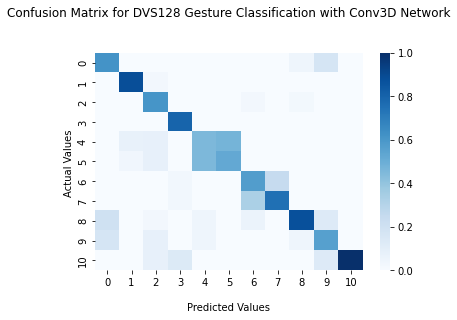

In [ ]:
from sklearn.metrics import confusion_matrix
import numpy as np
from keras.utils import np_utils
import seaborn as sns

#Create confusion matrix and normalizes it over predicted (columns)
result = confusion_matrix(y_test.argmax(axis=1), y_pred.argmax(axis=1), normalize='pred')

ax = sns.heatmap(result, annot=False, cmap='Blues')

ax.set_title('Confusion Matrix for DVS128 Gesture Classification with Conv3D Network\n\n');
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels([i for i in range(12)])
ax.yaxis.set_ticklabels([i for i in range(12)])

### Conv LTSM Network

In [ ]:
import tensorflow as tf
from tensorflow.keras import models, layers
from tensorflow.keras.optimizers import Adam
from keras.callbacks import EarlyStopping
from keras.utils import np_utils
import keras
from keras.callbacks import TensorBoard
from sklearn.model_selection import train_test_split

timesteps = 20
width = 128
height = 128
channels = 2
action_num = 12
nb_classes = 12

model = models.Sequential(
    [
        layers.Input(
            shape=(timesteps, channels, width, height)
        ),
        layers.ConvLSTM2D(
            filters=64, kernel_size=(3, 3), padding="same", return_sequences=True, dropout=0.1, recurrent_dropout=0.1
        ),
        layers.MaxPool3D(
            pool_size=(1, 2, 2), strides=(1, 2, 2), padding="same"
        ),
        layers.BatchNormalization(),
        layers.ConvLSTM2D(
            filters=32, kernel_size=(3, 3), padding="same", return_sequences=True, dropout=0.1, recurrent_dropout=0.1
        ),
        layers.MaxPool3D(
            pool_size=(1, 2, 2), strides=(1, 2, 2), padding="same"
        ),
        layers.BatchNormalization(),
        layers.ConvLSTM2D(
            filters=16, kernel_size=(3, 3), padding="same", return_sequences=False, dropout=0.1, recurrent_dropout=0.1
        ),
        layers.MaxPool2D(
            pool_size=(2, 2), strides=(2, 2), padding="same"
        ),
        layers.BatchNormalization(),
        layers.Flatten(),
        layers.Dense(256, activation='relu'),
        layers.Dense(action_num, activation='softmax')
    ]
)

model.compile(loss='categorical_crossentropy',
              optimizer=Adam(lr=1e-4),
              metrics=['accuracy'])

logdir = "logs/scalars/conv_lstm_dvs128"

# Training  the model along with creating callbacks to tensorboard for graphical visualization of training process
tbcallback = keras.callbacks.TensorBoard(log_dir=logdir, histogram_freq=0, write_graph=True, write_images=True)

early_stopping = EarlyStopping(monitor='val_accuracy', patience=4, restore_best_weights=True)

# Spliting the dataset for testing and training
x_train_new, x_val_new, y_train_new, y_val_new =  train_test_split(x_train, y_train, test_size=0.2, random_state=4)

model.fit(x_train_new, y_train_new, batch_size=24, epochs=60, validation_data=(x_val_new, y_val_new), callbacks=[early_stopping, tbcallback])

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d (ConvLSTM2D)    (None, 20, 2, 128, 64)    442624    
                                                                 
 max_pooling3d (MaxPooling3D  (None, 20, 1, 64, 64)    0         
 )                                                               
                                                                 
 batch_normalization (BatchN  (None, 20, 1, 64, 64)    256       
 ormalization)                                                   
                                                                 
 conv_lstm2d_1 (ConvLSTM2D)  (None, 20, 1, 64, 32)     110720    
                                                                 
 max_pooling3d_1 (MaxPooling  (None, 20, 1, 32, 32)    0         
 3D)                                                             
                                                        

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/60
40/40 [==============================] - 32s 540ms/step - loss: 1.9644 - accuracy: 0.3234 - val_loss: 2.4802 - val_accuracy: 0.0847
Epoch 2/60
40/40 [==============================] - 20s 488ms/step - loss: 1.2908 - accuracy: 0.5638 - val_loss: 2.4755 - val_accuracy: 0.0847
Epoch 3/60
40/40 [==============================] - 20s 492ms/step - loss: 0.9952 - accuracy: 0.6766 - val_loss: 2.4714 - val_accuracy: 0.0847
Epoch 4/60
40/40 [==============================] - 20s 490ms/step - loss: 0.8493 - accuracy: 0.7309 - val_loss: 2.4681 - val_accuracy: 0.0847
Epoch 5/60
40/40 [==============================] - 20s 489ms/step - loss: 0.7315 - accuracy: 0.7489 - val_loss: 2.4548 - val_accuracy: 0.0847
Epoch 6/60
40/40 [==============================] - 19s 483ms/step - loss: 0.6433 - accuracy: 0.7851 - val_loss: 2.4198 - val_accuracy: 0.0847
Epoch 7/60
40/40 [==============================] - 19s 486ms/step - loss: 0.5794 - accuracy: 0.8096 - val_loss: 2.3685 - val_accuracy: 0.0890

In [ ]:
from keras.models import load_model

model.save('/content/drive/MyDrive/models/conv_lstm_dvs128.h5')  # creates a HDF5 file 'my_model.h5'
# del model  # deletes the existing model

#### Results

In [ ]:
from keras.models import load_model
model = load_model('/content/drive/MyDrive/models/conv_lstm_dvs128.h5')

In [ ]:
from keras.utils import np_utils

score = model.evaluate(x_test, y_test, verbose=0)
y_pred = model.predict(x_test)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

Test loss: 0.7864974737167358
Test accuracy: 0.7152777910232544


In [ ]:
from sklearn.metrics import classification_report

print(classification_report(y_test.argmax(axis=1), y_pred.argmax(axis=1)))

              precision    recall  f1-score   support

           0       0.55      0.88      0.68        24
           1       0.83      1.00      0.91        24
           2       0.77      0.83      0.80        24
           3       0.80      1.00      0.89        24
           4       0.60      0.75      0.67        24
           5       0.75      0.38      0.50        24
           6       0.80      0.33      0.47        24
           7       0.57      0.88      0.69        24
           8       0.75      0.79      0.77        48
           9       0.89      0.33      0.48        24
          10       0.94      0.62      0.75        24

    accuracy                           0.72       288
   macro avg       0.75      0.71      0.69       288
weighted avg       0.75      0.72      0.70       288



[Text(0, 0.5, '0'),
 Text(0, 1.5, '1'),
 Text(0, 2.5, '2'),
 Text(0, 3.5, '3'),
 Text(0, 4.5, '4'),
 Text(0, 5.5, '5'),
 Text(0, 6.5, '6'),
 Text(0, 7.5, '7'),
 Text(0, 8.5, '8'),
 Text(0, 9.5, '9'),
 Text(0, 10.5, '10')]

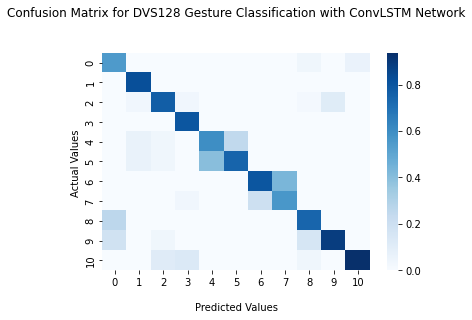

In [ ]:
from sklearn.metrics import confusion_matrix
import numpy as np
from keras.utils import np_utils
import seaborn as sns

#Create confusion matrix and normalizes it over predicted (columns)
result = confusion_matrix(y_test.argmax(axis=1), y_pred.argmax(axis=1), normalize='pred')

ax = sns.heatmap(result, annot=False, cmap='Blues')

ax.set_title('Confusion Matrix for DVS128 Gesture Classification with ConvLSTM Network\n\n');
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels([i for i in range(12)])
ax.yaxis.set_ticklabels([i for i in range(12)])

### Custom LTSM Network 1

In [ ]:
from keras.layers import Conv2D, MaxPooling2D, Flatten

def build_convnet(shape=(128, 128, 2)):
  model = Sequential()
  model.add(Conv2D(512, (3,3), padding='same', input_shape=shape))
  model.add(Activation('relu'))

  model.add(MaxPooling2D(pool_size=(2,2)))

  model.add(Conv2D(256, (5,5), padding='same'))
  model.add(Activation('relu'))

  model.add(MaxPooling2D(pool_size=(2,2)))

  model.add(Conv2D(128, (7,7), padding='same'))
  model.add(Activation('relu'))

  model.add(MaxPooling2D(pool_size=(2,2)))

  # model.add(Conv2D(64, (9,9), padding='same'))
  # model.add(Activation('relu'))

  # model.add(MaxPooling2D(pool_size=(2,2)))

  model.add(Flatten())

  # model.add(Dense(512))
  # model.add(Activation('relu'))
  return model

In [ ]:
from keras.layers.core import Dense, Activation, Dropout
from keras.layers.recurrent import LSTM
from keras.models import Sequential
from keras.layers import TimeDistributed, GRU

def action_model(shape=(20, 128, 128, 2), nbout=12):
    # Create our convnet with (34, 34, 1) input shape
    print("done")
    convnet = build_convnet(shape[1:])

    # then create our final model
    model = Sequential()
    # add the convnet with (8, 34, 34, 1) shape
    model.add(TimeDistributed(convnet, input_shape=shape))
    # here, you can also use GRU or LSTM
    model.add(GRU(64))
    # and finally, we make a decision network
    model.add(Dense(1024, activation='relu'))
    model.add(Dropout(.5))
    model.add(Dense(512, activation='relu'))
    model.add(Dropout(.5))
    model.add(Dense(128, activation='relu'))
    model.add(Dropout(.5))
    model.add(Dense(64, activation='relu'))
    model.add(Dense(nbout, activation='softmax'))
    return model

In [ ]:
from keras.callbacks import EarlyStopping
from keras.callbacks import TensorBoard
import keras
from sklearn.model_selection import train_test_split
from tensorflow.keras.optimizers import Adam

model = action_model(x_train.shape[1:], 12)
opt = Adam(lr=0.0001, decay=1e-6)

model.compile(loss='categorical_crossentropy', optimizer=opt, metrics=['accuracy'])

early_stopping = EarlyStopping(monitor='val_accuracy', patience=4, restore_best_weights=True)
logdir = "logs/NMNIST_ConvLSTM"
# Training  the model along with creating callbacks to tensorboard for graphical visualization of training process
tbcallback = keras.callbacks.TensorBoard(log_dir=logdir, histogram_freq=0, write_graph=True, write_images=True)

# Spliting the dataset for testing and training
x_train_new, x_val_new, y_train_new, y_val_new = train_test_split(x_train, y_train, test_size=0.2, random_state=4)
history = model.fit(x_train_new, y_train_new, batch_size=4, epochs=60, validation_data=(x_val_new, y_val_new), callbacks=[early_stopping, tbcallback])

done
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 time_distributed (TimeDistr  (None, 20, 32768)        4892544   
 ibuted)                                                         
                                                                 
 gru (GRU)                   (None, 64)                6304128   
                                                                 
 dense (Dense)               (None, 1024)              66560     
                                                                 
 dropout (Dropout)           (None, 1024)              0         
                                                                 
 dense_1 (Dense)             (None, 512)               524800    
                                                                 
 dropout_1 (Dropout)         (None, 512)               0         
                                                 

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/60
235/235 [==============================] - 208s 745ms/step - loss: 2.2698 - accuracy: 0.1915 - val_loss: 1.7881 - val_accuracy: 0.3814
Epoch 2/60
235/235 [==============================] - 155s 662ms/step - loss: 1.7160 - accuracy: 0.3585 - val_loss: 1.2280 - val_accuracy: 0.5551
Epoch 3/60
235/235 [==============================] - 156s 663ms/step - loss: 1.3442 - accuracy: 0.4745 - val_loss: 1.0278 - val_accuracy: 0.5720
Epoch 4/60
235/235 [==============================] - 156s 664ms/step - loss: 1.1254 - accuracy: 0.5479 - val_loss: 0.8517 - val_accuracy: 0.6525
Epoch 5/60
235/235 [==============================] - 156s 664ms/step - loss: 0.9366 - accuracy: 0.6213 - val_loss: 0.7968 - val_accuracy: 0.6610
Epoch 6/60
235/235 [==============================] - 156s 663ms/step - loss: 0.7808 - accuracy: 0.6798 - val_loss: 0.7067 - val_accuracy: 0.7119
Epoch 7/60
235/235 [==============================] - 156s 663ms/step - loss: 0.6479 - accuracy: 0.7287 - val_loss: 0.6664 -

In [ ]:
from keras.models import load_model

model.save('/content/drive/MyDrive/models/custom_conv_lstm_dvs128.h5')  # creates a HDF5 file 'my_model.h5'
# del model  # deletes the existing model

#### Results

In [ ]:
from keras.models import load_model
model = load_model('/content/drive/MyDrive/models/custom_conv_lstm_dvs128.h5')

In [ ]:
score = model.evaluate(x_test, y_test, verbose=0, batch_size=4)
y_pred = model.predict(x_test, batch_size=4)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

Test loss: 1.127624273300171
Test accuracy: 0.7638888955116272


In [ ]:
from sklearn.metrics import classification_report

print(classification_report(y_test.argmax(axis=1), y_pred.argmax(axis=1)))

              precision    recall  f1-score   support

           0       0.77      0.83      0.80        24
           1       0.92      0.96      0.94        24
           2       0.82      0.75      0.78        24
           3       0.91      0.88      0.89        24
           4       0.58      0.75      0.65        24
           5       0.70      0.58      0.64        24
           6       0.52      0.58      0.55        24
           7       0.54      0.54      0.54        24
           8       0.94      0.98      0.96        48
           9       0.70      0.67      0.68        24
          10       0.94      0.67      0.78        24

    accuracy                           0.76       288
   macro avg       0.76      0.74      0.75       288
weighted avg       0.77      0.76      0.76       288



[Text(0, 0.5, '0'),
 Text(0, 1.5, '1'),
 Text(0, 2.5, '2'),
 Text(0, 3.5, '3'),
 Text(0, 4.5, '4'),
 Text(0, 5.5, '5'),
 Text(0, 6.5, '6'),
 Text(0, 7.5, '7'),
 Text(0, 8.5, '8'),
 Text(0, 9.5, '9'),
 Text(0, 10.5, '10')]

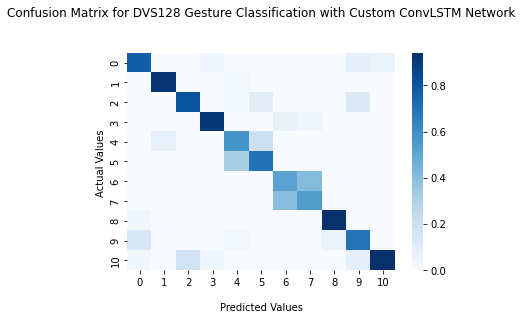

In [ ]:
from sklearn.metrics import confusion_matrix
import numpy as np
from keras.utils import np_utils
import seaborn as sns

#Create confusion matrix and normalizes it over predicted (columns)
result = confusion_matrix(y_test.argmax(axis=1), y_pred.argmax(axis=1), normalize='pred')

ax = sns.heatmap(result, annot=False, cmap='Blues')

ax.set_title('Confusion Matrix for DVS128 Gesture Classification with Custom ConvLSTM Network\n\n');
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels([i for i in range(12)])
ax.yaxis.set_ticklabels([i for i in range(12)])

#CIFAR10 DVS

## Working with Data

### Saving Data

In [ ]:
!pip -q install spikingjelly
from spikingjelly.datasets.cifar10_dvs import CIFAR10DVS
import numpy as np

!mkdir /content/datasets
!mkdir /content/datasets/CIFAR10DVS
!mkdir /content/datasets/CIFAR10DVS/download
root_dir = "/content/datasets/CIFAR10DVS"
data_set = CIFAR10DVS(root_dir, data_type='frame', frames_number=20,split_by='number')

     |████████████████████████████████| 237 kB 5.1 MB/s 
The [/content/datasets/CIFAR10DVS/download] directory for saving downloaded files already exists, check files...
The file [/content/datasets/CIFAR10DVS/download/airplane.zip] does not exist or is corrupted.
Download [airplane.zip] from [https://ndownloader.figshare.com/files/7712788] to [/content/datasets/CIFAR10DVS/download]


  0%|          | 0/747054427 [00:00<?, ?it/s]

The file [/content/datasets/CIFAR10DVS/download/automobile.zip] does not exist or is corrupted.
Download [automobile.zip] from [https://ndownloader.figshare.com/files/7712791] to [/content/datasets/CIFAR10DVS/download]


  0%|          | 0/970159102 [00:00<?, ?it/s]

The file [/content/datasets/CIFAR10DVS/download/bird.zip] does not exist or is corrupted.
Download [bird.zip] from [https://ndownloader.figshare.com/files/7712794] to [/content/datasets/CIFAR10DVS/download]


  0%|          | 0/760766288 [00:00<?, ?it/s]

The file [/content/datasets/CIFAR10DVS/download/cat.zip] does not exist or is corrupted.
Download [cat.zip] from [https://ndownloader.figshare.com/files/7712812] to [/content/datasets/CIFAR10DVS/download]


  0%|          | 0/843271197 [00:00<?, ?it/s]

The file [/content/datasets/CIFAR10DVS/download/deer.zip] does not exist or is corrupted.
Download [deer.zip] from [https://ndownloader.figshare.com/files/7712815] to [/content/datasets/CIFAR10DVS/download]


  0%|          | 0/778283422 [00:00<?, ?it/s]

The file [/content/datasets/CIFAR10DVS/download/dog.zip] does not exist or is corrupted.
Download [dog.zip] from [https://ndownloader.figshare.com/files/7712818] to [/content/datasets/CIFAR10DVS/download]


  0%|          | 0/844609875 [00:00<?, ?it/s]

The file [/content/datasets/CIFAR10DVS/download/frog.zip] does not exist or is corrupted.
Download [frog.zip] from [https://ndownloader.figshare.com/files/7712842] to [/content/datasets/CIFAR10DVS/download]


  0%|          | 0/818824848 [00:00<?, ?it/s]

The file [/content/datasets/CIFAR10DVS/download/horse.zip] does not exist or is corrupted.
Download [horse.zip] from [https://ndownloader.figshare.com/files/7712851] to [/content/datasets/CIFAR10DVS/download]


  0%|          | 0/929265395 [00:00<?, ?it/s]

The file [/content/datasets/CIFAR10DVS/download/ship.zip] does not exist or is corrupted.
Download [ship.zip] from [https://ndownloader.figshare.com/files/7712836] to [/content/datasets/CIFAR10DVS/download]


  0%|          | 0/742404857 [00:00<?, ?it/s]

The file [/content/datasets/CIFAR10DVS/download/truck.zip] does not exist or is corrupted.
Download [truck.zip] from [https://ndownloader.figshare.com/files/7712839] to [/content/datasets/CIFAR10DVS/download]


  0%|          | 0/950111954 [00:00<?, ?it/s]

Streaming output truncated to the last 5000 lines.
Frames [/content/datasets/CIFAR10DVS/frames_number_20_split_by_number/truck/cifar10_truck_234.npz] saved.
Frames [/content/datasets/CIFAR10DVS/frames_number_20_split_by_number/truck/cifar10_truck_40.npz] saved.
Frames [/content/datasets/CIFAR10DVS/frames_number_20_split_by_number/truck/cifar10_truck_996.npz] saved.
Frames [/content/datasets/CIFAR10DVS/frames_number_20_split_by_number/truck/cifar10_truck_863.npz] saved.
Frames [/content/datasets/CIFAR10DVS/frames_number_20_split_by_number/truck/cifar10_truck_152.npz] saved.
Frames [/content/datasets/CIFAR10DVS/frames_number_20_split_by_number/truck/cifar10_truck_496.npz] saved.
Frames [/content/datasets/CIFAR10DVS/frames_number_20_split_by_number/truck/cifar10_truck_917.npz] saved.
Frames [/content/datasets/CIFAR10DVS/frames_number_20_split_by_number/truck/cifar10_truck_125.npz] saved.
Frames [/content/datasets/CIFAR10DVS/frames_number_20_split_by_number/truck/cifar10_truck_693.npz] sav

### Loading Data

In [ ]:
import os
import numpy as np
from sklearn.model_selection import train_test_split

classes = ["airplane", "automobile", "bird", "cat", "deer", "dog", "frog", "horse", "ship", "truck"]

data_filepaths = []
data_labels = []
print("Checking all frames")
count = 0
for act_class in classes:
    class_directory = "/content/datasets/CIFAR10DVS/frames_number_20_split_by_number/{0}".format(act_class)
    for reconstruction in os.listdir(class_directory):
      current_recon_dir = os.path.join(class_directory, reconstruction)
      data_filepaths.append(current_recon_dir)
      data_labels.append(count)
    count += 1

training_filepaths, testing_filepaths, training_labels, testing_labels = train_test_split(data_filepaths, data_labels, test_size=0.2, random_state=4)
training_filepaths, validation_filepaths, training_labels, validation_labels = train_test_split(training_filepaths, training_labels, test_size=0.25, random_state=4)

print("Training samples: {0}".format(len(training_filepaths)))
print("Validation samples: {0}".format(len(validation_filepaths)))
print("Testing samples: {0}".format(len(testing_filepaths)))

Checking all frames
Training samples: 6000
Validation samples: 2000
Testing samples: 2000


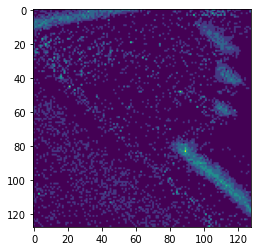

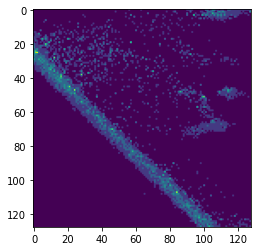

In [ ]:
import matplotlib.pyplot as plt

test = np.load("/content/datasets/CIFAR10DVS/frames_number_20_split_by_number/airplane/cifar10_airplane_0.npz")["frames"]
plt.imshow(test[0][0])
plt.show()
plt.imshow(test[0][1])
plt.show()

In [ ]:
from tensorflow.keras.utils import Sequence
from skimage.io import imread
from skimage.transform import resize
import numpy as np
import os
from keras.utils import np_utils
from itertools import islice, cycle
import imageio

class MyGenerator(Sequence):

    def __init__(self, video_filepaths, labels, batch_size):
        self.video_filepaths, self.labels = video_filepaths, [np_utils.to_categorical(label, 10) for label in labels]
        self.batch_size = batch_size

    def __len__(self):
        return int(np.ceil(len(self.video_filepaths) / float(self.batch_size)))

    def __getitem__(self, idx):
        batch_x = self.video_filepaths[idx * self.batch_size:(idx + 1) * self.batch_size]
        batch_y = self.labels[idx * self.batch_size:(idx + 1) * self.batch_size]
        x_ret = []
        for reconstruction_dir in batch_x:
          tmp = np.load(reconstruction_dir)["frames"]
          tmp = np.moveaxis(tmp, 1, -1)
          x_ret.append(tmp)

        x_ret = np.array(x_ret)
        # x_ret = x_ret.reshape(x_ret.shape[0], x_ret.shape[1], x_ret.shape[2], x_ret.shape[3], 2)
        return x_ret, np.array(batch_y)

batch_size = 16
my_training_batch_generator = MyGenerator(training_filepaths, training_labels, batch_size)
my_validation_batch_generator = MyGenerator(validation_filepaths, validation_labels, batch_size)
my_testing_batch_generator = MyGenerator(testing_filepaths, testing_labels, batch_size)

## Classification Networks

### Custom Conv3D Network

In [ ]:
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.layers.core import Dense, Dropout, Activation, Flatten
from keras.layers.convolutional import Convolution3D, MaxPooling3D
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.optimizers import Adam
from keras.utils import np_utils
from keras.callbacks import TensorBoard, EarlyStopping
import keras
import datetime

# Initialing the Training Parameters
batch_size =3
nb_classes = 10
nb_epoch = 120

# Number of convolutional filters to use at each layer
nb_filters = 32
# Level of pooling to perform at each layer (POOL x POOL)
nb_pool = 3
# Level of convolution to perform at each layer (CONV x CONV)
nb_conv = 5

# Defining the 3D Convolution Neural Network model
model = Sequential()
model.add(Convolution3D(nb_filters,kernel_size=nb_conv,input_shape=(20, 128, 128, 2), activation='relu',padding='same'))
model.add(BatchNormalization())
model.add(Convolution3D(nb_filters,kernel_size=nb_conv,input_shape=(20, 128, 128, 2), activation='relu',padding='same'))
model.add(BatchNormalization())
model.add(MaxPooling3D(pool_size=nb_pool,padding='same'))

model.add(Dropout(0.25))

model.add(Convolution3D(nb_filters*2,kernel_size=nb_conv,activation='relu',padding='same'))
model.add(BatchNormalization())
model.add(MaxPooling3D(pool_size=nb_pool,padding='same'))

model.add(Dropout(0.25))

model.add(Convolution3D(nb_filters*4,kernel_size=nb_conv,activation='relu',padding='same'))
model.add(BatchNormalization())
model.add(Convolution3D(nb_filters*4,kernel_size=nb_conv,activation='relu',padding='same'))
model.add(BatchNormalization())
model.add(MaxPooling3D(pool_size=nb_pool,padding='same'))

model.add(Dropout(0.25))

model.add(Flatten())
model.add(Dense(128,kernel_initializer = 'he_normal',activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.5))
model.add(Dense(nb_classes,kernel_initializer = 'he_normal'))
model.add(Activation('softmax'))

opt=Adam(lr=0.0001)

# Compile the model
model.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])

early_stopping = EarlyStopping(monitor='val_accuracy', patience=4, restore_best_weights=True)

hist = model.fit(my_training_batch_generator, validation_data=(my_validation_batch_generator),
          batch_size=batch_size, epochs=nb_epoch, shuffle=True, verbose=1, callbacks=[early_stopping])

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/120
375/375 [==============================] - 423s 1s/step - loss: 2.7688 - accuracy: 0.1910 - val_loss: 2.9751 - val_accuracy: 0.1615
Epoch 2/120
375/375 [==============================] - 402s 1s/step - loss: 2.3827 - accuracy: 0.2507 - val_loss: 2.6454 - val_accuracy: 0.1830
Epoch 3/120
375/375 [==============================] - 402s 1s/step - loss: 2.1780 - accuracy: 0.2872 - val_loss: 1.9489 - val_accuracy: 0.3365
Epoch 4/120
375/375 [==============================] - 402s 1s/step - loss: 2.0166 - accuracy: 0.3350 - val_loss: 1.8682 - val_accuracy: 0.3610
Epoch 5/120
375/375 [==============================] - 402s 1s/step - loss: 1.8808 - accuracy: 0.3695 - val_loss: 1.6933 - val_accuracy: 0.4170
Epoch 6/120
375/375 [==============================] - 402s 1s/step - loss: 1.7511 - accuracy: 0.4073 - val_loss: 1.7064 - val_accuracy: 0.4145
Epoch 7/120
375/375 [==============================] - 402s 1s/step - loss: 1.6413 - accuracy: 0.4432 - val_loss: 1.5985 - val_accuracy:

In [ ]:
from keras.models import load_model

model.save('/content/drive/MyDrive/models/conv3d_cifar10dvs.h5')  # creates a HDF5 file 'my_model.h5'
# del model  # deletes the existing model

#### Results

In [ ]:
from keras.models import load_model

model = load_model('/content/drive/MyDrive/models/conv3d_cifar10dvs.h5')

In [ ]:
score = model.evaluate(my_testing_batch_generator, batch_size=3, verbose=0)
y_pred = model.predict(my_testing_batch_generator)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

Test loss: 1.0907049179077148
Test accuracy: 0.6320000290870667


In [ ]:
from sklearn.metrics import classification_report

print(classification_report(testing_labels, y_pred.argmax(axis=1)))

              precision    recall  f1-score   support

           0       0.60      0.64      0.62       196
           1       0.81      0.82      0.82       204
           2       0.54      0.39      0.45       204
           3       0.43      0.27      0.33       198
           4       0.57      0.59      0.58       196
           5       0.59      0.61      0.60       204
           6       0.54      0.86      0.66       209
           7       0.79      0.52      0.62       184
           8       0.62      0.77      0.69       190
           9       0.84      0.82      0.83       215

    accuracy                           0.63      2000
   macro avg       0.63      0.63      0.62      2000
weighted avg       0.63      0.63      0.62      2000



[Text(0, 0.5, '0'),
 Text(0, 1.5, '1'),
 Text(0, 2.5, '2'),
 Text(0, 3.5, '3'),
 Text(0, 4.5, '4'),
 Text(0, 5.5, '5'),
 Text(0, 6.5, '6'),
 Text(0, 7.5, '7'),
 Text(0, 8.5, '8'),
 Text(0, 9.5, '9')]

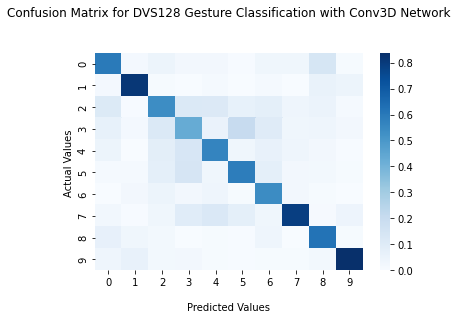

In [ ]:
from sklearn.metrics import confusion_matrix
import numpy as np
from keras.utils import np_utils
import seaborn as sns

#Create confusion matrix and normalizes it over predicted (columns)
result = confusion_matrix(testing_labels, y_pred.argmax(axis=1), normalize='pred')

ax = sns.heatmap(result, annot=False, cmap='Blues')

ax.set_title('Confusion Matrix for DVS128 Gesture Classification with Conv3D Network\n\n');
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels([i for i in range(12)])
ax.yaxis.set_ticklabels([i for i in range(12)])

### Conv LTSM Network

In [ ]:
import tensorflow as tf
from tensorflow.keras import models, layers
from tensorflow.keras.optimizers import Adam
from keras.callbacks import EarlyStopping
import keras

timesteps = 20
width = 128
height = 128
channels = 2
action_num = 10
batch_size = 1

model = models.Sequential(
    [
        layers.Input(
            shape=(timesteps, width, height, channels)
        ),
        layers.ConvLSTM2D(
            filters=16, kernel_size=(3, 3), padding="same", return_sequences=True, dropout=0.1, recurrent_dropout=0.1
        ),
        layers.MaxPool3D(
            pool_size=(1, 2, 2), strides=(1, 2, 2), padding="same"
        ),
        layers.BatchNormalization(),
        layers.ConvLSTM2D(
            filters=8, kernel_size=(3, 3), padding="same", return_sequences=True, dropout=0.1, recurrent_dropout=0.1
        ),
        layers.MaxPool3D(
            pool_size=(1, 2, 2), strides=(1, 2, 2), padding="same"
        ),
        layers.BatchNormalization(),
        layers.ConvLSTM2D(
            filters=4, kernel_size=(3, 3), padding="same", return_sequences=False, dropout=0.1, recurrent_dropout=0.1
        ),
        layers.MaxPool2D(
            pool_size=(2, 2), strides=(2, 2), padding="same"
        ),
        layers.BatchNormalization(),
        layers.Flatten(),
        layers.Dense(256, activation='relu'),
        layers.Dense(action_num, activation='softmax')
    ]
)

opt=Adam(lr=0.0001)

# Compile the model
model.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])

early_stopping = EarlyStopping(monitor='val_accuracy', patience=4, restore_best_weights=True)

hist = model.fit(my_training_batch_generator, validation_data=(my_validation_batch_generator),
          batch_size=batch_size, epochs=nb_epoch, shuffle=True, verbose=1, callbacks=[early_stopping])

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/120


ResourceExhaustedError: ignored

In [ ]:
from keras.models import load_model

model.save('/content/drive/MyDrive/models/conv_lstm_cifar10dvs.h5')  # creates a HDF5 file 'my_model.h5'
# del model  # deletes the existing model

#### Results

In [ ]:
from keras.models import load_model
model = load_model('/content/drive/MyDrive/models/conv_lstm_cifar10dvs.h5')

In [ ]:
from keras.utils import np_utils

score = model.evaluate(my_testing_batch_generator, verbose=0)
y_pred = model.predict(my_testing_batch_generator)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

Test loss: 1.7313363552093506
Test accuracy: 0.41999998688697815


In [ ]:
from sklearn.metrics import classification_report

print(classification_report(testing_labels, y_pred.argmax(axis=1)))

              precision    recall  f1-score   support

           0       0.41      0.48      0.45       196
           1       0.47      0.58      0.52       204
           2       0.41      0.23      0.29       204
           3       0.20      0.13      0.16       198
           4       0.38      0.29      0.32       196
           5       0.44      0.53      0.48       204
           6       0.50      0.38      0.43       209
           7       0.34      0.50      0.41       184
           8       0.45      0.51      0.48       190
           9       0.51      0.57      0.54       215

    accuracy                           0.42      2000
   macro avg       0.41      0.42      0.41      2000
weighted avg       0.41      0.42      0.41      2000



[Text(0, 0.5, '0'),
 Text(0, 1.5, '1'),
 Text(0, 2.5, '2'),
 Text(0, 3.5, '3'),
 Text(0, 4.5, '4'),
 Text(0, 5.5, '5'),
 Text(0, 6.5, '6'),
 Text(0, 7.5, '7'),
 Text(0, 8.5, '8'),
 Text(0, 9.5, '9')]

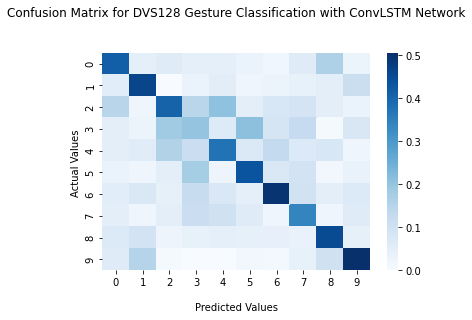

In [ ]:
from sklearn.metrics import confusion_matrix
import numpy as np
from keras.utils import np_utils
import seaborn as sns

#Create confusion matrix and normalizes it over predicted (columns)
result = confusion_matrix(testing_labels, y_pred.argmax(axis=1), normalize='pred')

ax = sns.heatmap(result, annot=False, cmap='Blues')

ax.set_title('Confusion Matrix for DVS128 Gesture Classification with ConvLSTM Network\n\n');
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels([i for i in range(12)])
ax.yaxis.set_ticklabels([i for i in range(12)])

### Custom LTSM Network 1

In [ ]:
from keras.layers import Conv2D, MaxPooling2D, Flatten

def build_convnet(shape=(128, 128, 2)):
  model = Sequential()
  model.add(Conv2D(128, (3,3), padding='same', input_shape=shape))
  model.add(Activation('relu'))

  model.add(MaxPooling2D(pool_size=(2,2)))

  model.add(Conv2D(64, (5,5), padding='same'))
  model.add(Activation('relu'))

  model.add(MaxPooling2D(pool_size=(2,2)))

  model.add(Conv2D(32, (7,7), padding='same'))
  model.add(Activation('relu'))

  model.add(MaxPooling2D(pool_size=(2,2)))

  model.add(Flatten())

  return model

In [ ]:
from keras.layers.core import Dense, Activation, Dropout
from keras.layers.recurrent import LSTM
from keras.models import Sequential
from keras.layers import TimeDistributed, GRU

def action_model(shape=(20, 128, 128, 2), nbout=12):
    # Create our convnet with (34, 34, 1) input shape
    print("done")
    convnet = build_convnet(shape[1:])

    # then create our final model
    model = Sequential()
    # add the convnet with (8, 34, 34, 1) shape
    model.add(TimeDistributed(convnet, input_shape=shape))
    # here, you can also use GRU or LSTM
    model.add(GRU(64))
    # and finally, we make a decision network
    model.add(Dense(1024, activation='relu'))
    model.add(Dropout(.5))
    model.add(Dense(512, activation='relu'))
    model.add(Dropout(.5))
    model.add(Dense(128, activation='relu'))
    model.add(Dropout(.5))
    model.add(Dense(64, activation='relu'))
    model.add(Dense(nbout, activation='softmax'))
    return model

In [ ]:
from keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam

batch_size = 1
nb_epoch = 120

model = action_model((20, 128, 128, 2), 10)
opt = Adam(lr=0.0001, decay=1e-6)

model.compile(loss='categorical_crossentropy', optimizer=opt, metrics=['accuracy'])

early_stopping = EarlyStopping(monitor='val_accuracy', patience=4, restore_best_weights=True)

hist = model.fit(my_training_batch_generator, validation_data=(my_validation_batch_generator),
          batch_size=batch_size, epochs=nb_epoch, shuffle=True, verbose=1, callbacks=[early_stopping])

done


/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/120
375/375 [==============================] - 140s 363ms/step - loss: 2.2678 - accuracy: 0.1268 - val_loss: 2.1583 - val_accuracy: 0.1605
Epoch 2/120
375/375 [==============================] - 136s 363ms/step - loss: 2.1196 - accuracy: 0.1782 - val_loss: 1.9878 - val_accuracy: 0.2555
Epoch 3/120
375/375 [==============================] - 137s 366ms/step - loss: 1.9565 - accuracy: 0.2445 - val_loss: 1.8554 - val_accuracy: 0.2905
Epoch 4/120
375/375 [==============================] - 137s 364ms/step - loss: 1.7721 - accuracy: 0.3248 - val_loss: 1.6960 - val_accuracy: 0.3700
Epoch 5/120
375/375 [==============================] - 137s 364ms/step - loss: 1.5969 - accuracy: 0.4000 - val_loss: 1.6190 - val_accuracy: 0.4055
Epoch 6/120
375/375 [==============================] - 136s 362ms/step - loss: 1.3944 - accuracy: 0.4752 - val_loss: 1.6047 - val_accuracy: 0.4505
Epoch 7/120
375/375 [==============================] - 135s 361ms/step - loss: 1.1380 - accuracy: 0.5695 - val_loss: 1

In [ ]:
from keras.models import load_model

model.save('/content/drive/MyDrive/models/custom_conv_lstm_dvs128.h5')  # creates a HDF5 file 'my_model.h5'
# del model  # deletes the existing model

#### Results

In [ ]:
from keras.models import load_model
model = load_model('/content/drive/MyDrive/models/custom_conv_lstm_dvs128.h5')

In [ ]:
score = model.evaluate(my_testing_batch_generator, verbose=0, batch_size=4)
y_pred = model.predict(my_testing_batch_generator, batch_size=4)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

Test loss: 1.6310765743255615
Test accuracy: 0.4790000021457672


In [ ]:
from sklearn.metrics import classification_report

print(classification_report(testing_labels, y_pred.argmax(axis=1)))

              precision    recall  f1-score   support

           0       0.49      0.56      0.52       196
           1       0.69      0.60      0.64       204
           2       0.32      0.25      0.28       204
           3       0.24      0.14      0.17       198
           4       0.36      0.48      0.41       196
           5       0.45      0.56      0.50       204
           6       0.60      0.48      0.53       209
           7       0.45      0.65      0.53       184
           8       0.54      0.49      0.52       190
           9       0.59      0.60      0.60       215

    accuracy                           0.48      2000
   macro avg       0.47      0.48      0.47      2000
weighted avg       0.48      0.48      0.47      2000



[Text(0, 0.5, '0'),
 Text(0, 1.5, '1'),
 Text(0, 2.5, '2'),
 Text(0, 3.5, '3'),
 Text(0, 4.5, '4'),
 Text(0, 5.5, '5'),
 Text(0, 6.5, '6'),
 Text(0, 7.5, '7'),
 Text(0, 8.5, '8'),
 Text(0, 9.5, '9')]

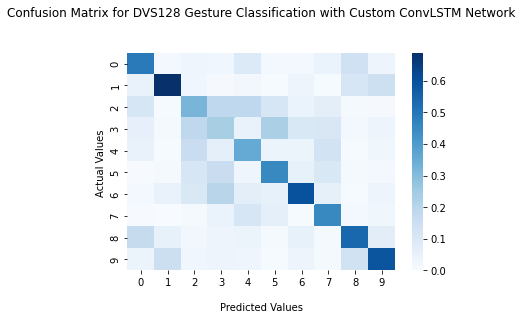

In [ ]:
from sklearn.metrics import confusion_matrix
import numpy as np
from keras.utils import np_utils
import seaborn as sns

#Create confusion matrix and normalizes it over predicted (columns)
result = confusion_matrix(testing_labels, y_pred.argmax(axis=1), normalize='pred')

ax = sns.heatmap(result, annot=False, cmap='Blues')

ax.set_title('Confusion Matrix for DVS128 Gesture Classification with Custom ConvLSTM Network\n\n');
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels([i for i in range(12)])
ax.yaxis.set_ticklabels([i for i in range(12)])

# E2VID

## Clone Repository

In [ ]:
!git clone https://github.com/uzh-rpg/rpg_e2vid.git

Cloning into 'rpg_e2vid'...
remote: Enumerating objects: 74, done.
remote: Counting objects: 100% (40/40), done.
remote: Compressing objects: 100% (19/19), done.
remote: Total 74 (delta 26), reused 21 (delta 21), pack-reused 34
Unpacking objects: 100% (74/74), done.


To run the video reconstruction model you need to run the following commands:

```bash
!cd rpg_e2vid/ && rm -rf outputs && mkdir outputs
!cd rpg_e2vid/ && python run_reconstruction.py \
  -c pretrained/E2VID_lightweight.pth.tar \
  -i data/NMNIST/Train/0/08356.zip \
  --auto_hdr \
  --output_folder outputs/
```

## Load Pre-Trained Weights and Data

### Weights

In [ ]:
!cd rpg_e2vid/ && wget "http://rpg.ifi.uzh.ch/data/E2VID/models/E2VID_lightweight.pth.tar" -O pretrained/E2VID_lightweight.pth.tar

--2022-06-22 06:47:50--  http://rpg.ifi.uzh.ch/data/E2VID/models/E2VID_lightweight.pth.tar
Resolving rpg.ifi.uzh.ch (rpg.ifi.uzh.ch)... 130.60.75.162
Connecting to rpg.ifi.uzh.ch (rpg.ifi.uzh.ch)|130.60.75.162|:80... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://rpg.ifi.uzh.ch/data/E2VID/models/E2VID_lightweight.pth.tar [following]
--2022-06-22 06:47:52--  https://rpg.ifi.uzh.ch/data/E2VID/models/E2VID_lightweight.pth.tar
Connecting to rpg.ifi.uzh.ch (rpg.ifi.uzh.ch)|130.60.75.162|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://download.ifi.uzh.ch/rpg/web/data/E2VID/models/E2VID_lightweight.pth.tar [following]
--2022-06-22 06:47:53--  https://download.ifi.uzh.ch/rpg/web/data/E2VID/models/E2VID_lightweight.pth.tar
Resolving download.ifi.uzh.ch (download.ifi.uzh.ch)... 130.60.61.200
Connecting to download.ifi.uzh.ch (download.ifi.uzh.ch)|130.60.61.200|:443... connected.
HTTP request sent, awai

## Loading Data

In [ ]:
!pip -q install spikingjelly
from spikingjelly.datasets.cifar10_dvs import CIFAR10DVS
import numpy as np

!mkdir /content/datasets
!mkdir /content/datasets/CIFAR10DVS
!mkdir /content/datasets/CIFAR10DVS/download
root_dir = "/content/datasets/CIFAR10DVS"
data_set = CIFAR10DVS(root_dir, data_type='event')

     |████████████████████████████████| 237 kB 4.3 MB/s 
The [/content/datasets/CIFAR10DVS/download] directory for saving downloaded files already exists, check files...
The file [/content/datasets/CIFAR10DVS/download/airplane.zip] does not exist or is corrupted.
Download [airplane.zip] from [https://ndownloader.figshare.com/files/7712788] to [/content/datasets/CIFAR10DVS/download]


  0%|          | 0/747054427 [00:00<?, ?it/s]

The file [/content/datasets/CIFAR10DVS/download/automobile.zip] does not exist or is corrupted.
Download [automobile.zip] from [https://ndownloader.figshare.com/files/7712791] to [/content/datasets/CIFAR10DVS/download]


  0%|          | 0/970159102 [00:00<?, ?it/s]

The file [/content/datasets/CIFAR10DVS/download/bird.zip] does not exist or is corrupted.
Download [bird.zip] from [https://ndownloader.figshare.com/files/7712794] to [/content/datasets/CIFAR10DVS/download]


  0%|          | 0/760766288 [00:00<?, ?it/s]

The file [/content/datasets/CIFAR10DVS/download/cat.zip] does not exist or is corrupted.
Download [cat.zip] from [https://ndownloader.figshare.com/files/7712812] to [/content/datasets/CIFAR10DVS/download]


  0%|          | 0/843271197 [00:00<?, ?it/s]

The file [/content/datasets/CIFAR10DVS/download/deer.zip] does not exist or is corrupted.
Download [deer.zip] from [https://ndownloader.figshare.com/files/7712815] to [/content/datasets/CIFAR10DVS/download]


  0%|          | 0/778283422 [00:00<?, ?it/s]

The file [/content/datasets/CIFAR10DVS/download/dog.zip] does not exist or is corrupted.
Download [dog.zip] from [https://ndownloader.figshare.com/files/7712818] to [/content/datasets/CIFAR10DVS/download]


  0%|          | 0/844609875 [00:00<?, ?it/s]

The file [/content/datasets/CIFAR10DVS/download/frog.zip] does not exist or is corrupted.
Download [frog.zip] from [https://ndownloader.figshare.com/files/7712842] to [/content/datasets/CIFAR10DVS/download]


  0%|          | 0/818824848 [00:00<?, ?it/s]

The file [/content/datasets/CIFAR10DVS/download/horse.zip] does not exist or is corrupted.
Download [horse.zip] from [https://ndownloader.figshare.com/files/7712851] to [/content/datasets/CIFAR10DVS/download]


  0%|          | 0/929265395 [00:00<?, ?it/s]

The file [/content/datasets/CIFAR10DVS/download/ship.zip] does not exist or is corrupted.
Download [ship.zip] from [https://ndownloader.figshare.com/files/7712836] to [/content/datasets/CIFAR10DVS/download]


  0%|          | 0/742404857 [00:00<?, ?it/s]

The file [/content/datasets/CIFAR10DVS/download/truck.zip] does not exist or is corrupted.
Download [truck.zip] from [https://ndownloader.figshare.com/files/7712839] to [/content/datasets/CIFAR10DVS/download]


  0%|          | 0/950111954 [00:00<?, ?it/s]

Streaming output truncated to the last 5000 lines.
Save [/content/datasets/CIFAR10DVS/extract/frog/cifar10_frog_148.aedat] to [/content/datasets/CIFAR10DVS/events_np/frog/cifar10_frog_148.npz].
Save [/content/datasets/CIFAR10DVS/extract/truck/cifar10_truck_172.aedat] to [/content/datasets/CIFAR10DVS/events_np/truck/cifar10_truck_172.npz].
Save [/content/datasets/CIFAR10DVS/extract/truck/cifar10_truck_113.aedat] to [/content/datasets/CIFAR10DVS/events_np/truck/cifar10_truck_113.npz].
Save [/content/datasets/CIFAR10DVS/extract/truck/cifar10_truck_206.aedat] to [/content/datasets/CIFAR10DVS/events_np/truck/cifar10_truck_206.npz].
Save [/content/datasets/CIFAR10DVS/extract/truck/cifar10_truck_533.aedat] to [/content/datasets/CIFAR10DVS/events_np/truck/cifar10_truck_533.npz].
Save [/content/datasets/CIFAR10DVS/extract/truck/cifar10_truck_547.aedat] to [/content/datasets/CIFAR10DVS/events_np/truck/cifar10_truck_547.npz].
Save [/content/datasets/CIFAR10DVS/extract/truck/cifar10_truck_186.aeda

In [ ]:
!rm -rf /content/reconstructions

In [ ]:
def restructure_spikingjelly_events(input_file, output_file):
  d = np.load(input_file)
  d = np.array([d["t"], d["x"], d["y"], d["p"]])
  p = [[128, 128]]
  for i in range(len(d[0])):
    p.append(d[:, i])
  text = ""
  for item in p:
    if(len(item) == 4):
      text = text + "{0} {1} {2} {3}\n".format(item[0], item[1], item[2], item[3])
    else:
      text = text + "{0} {1}\n".format(item[0], item[1])
  # Open a file with access mode 'a'
  outfile = open(output_file, 'w')
  # Append 'hello' at the end of file
  outfile.write(text)
  # Close the file
  outfile.close()

In [ ]:
import os
import shutil
import numpy as np

!rm -rf /content/rpg_e2vid/data/CIFAR10DVS
os.mkdir("/content/rpg_e2vid/data/CIFAR10DVS")
max_samples = 200
classes = ["airplane", "automobile", "bird", "cat", "deer", "dog", "frog", "horse", "ship", "truck"]

def load_cifar_10_samples():
  for act_class in classes:
    print(' class {0}'.format(act_class))
    directory = "/content/datasets/CIFAR10DVS/events_np/{0}".format(act_class)
    os.mkdir("/content/rpg_e2vid/data/CIFAR10DVS/{0}".format(act_class))
    count = 0
    for sample in os.listdir(directory):
        zip_directory = "/content/rpg_e2vid/data/CIFAR10DVS/{0}/{1}".format(act_class, sample[:-4])
        input_directory = os.path.join(directory, sample)
        output_directory = "{0}/events.txt".format(zip_directory)
        if os.path.isfile(input_directory) and count < max_samples:
            if(count % 60 != 0 or count == 0):
              print(".", end="")
            else:
              print(".")
            os.mkdir(zip_directory)
            restructure_spikingjelly_events(input_directory, output_directory)
            shutil.make_archive(zip_directory, 'zip', zip_directory)
            shutil.rmtree(zip_directory, ignore_errors=False, onerror=None)
        count = count + 1
    print("")

load_cifar_10_samples()

 class airplane
.............................................................
............................................................
............................................................
...................
 class automobile
.............................................................
............................................................
............................................................
...................
 class bird
.............................................................
............................................................
............................................................
...................
 class cat
.............................................................
............................................................
............................................................
...................
 class deer
.............................................................
.....................................................

In [ ]:
import subprocess
import os

classes = ["airplane", "automobile", "bird", "cat", "deer", "dog", "frog", "horse", "ship", "truck"]

!rm -rf /content/reconstructions
os.mkdir("/content/reconstructions")
os.mkdir("/content/reconstructions/CIFAR10DVS")

def reconstruct_CIFAR10DVS():
  for act_class in classes:
    print(' class {0}'.format(act_class))
    recon_directory = "/content/reconstructions/CIFAR10DVS/{0}".format(act_class)
    os.mkdir(recon_directory)
    sample_directory = "data/CIFAR10DVS/{0}".format(act_class)
    count = 0
    for sample in os.listdir("/content/rpg_e2vid/{0}".format(sample_directory)):
      new_directory = "{0}/{1}".format(recon_directory, sample[:-4])
      os.mkdir(new_directory)
      if(count % 60 != 0 or count == 0):
        print(".", end="")
      else:
        print(".")
      # print("-i /content/rpg_e2vid/{0}/{1}".format(sample_directory, sample))
      # print("-o {0}".format(new_directory))
      cmd = "python /content/rpg_e2vid/run_reconstruction.py \
            -c /content/rpg_e2vid/pretrained/E2VID_lightweight.pth.tar \
            -i /content/rpg_e2vid/{0}/{1} \
            --auto_hdr \
            --output_folder {2}".format(sample_directory, sample, new_directory)
      # subprocess.call(cmd, shell=True)
      process = subprocess.Popen(cmd.split(), stdout=subprocess.PIPE)
      output, error = process.communicate()
      # print(output.decode("utf-8") )
      count = count + 1
    print("")

reconstruct_CIFAR10DVS()

 class airplane
.............................................................
............................................................
............................................................
...................
 class automobile
.............................................................
............................................................
............................................................
...................
 class bird
.............................................................
............................................................
............................................................
...................
 class cat
.............................................................
............................................................
............................................................
...................
 class deer
.............................................................
.....................................................

In [ ]:
import os
import numpy as np
from sklearn.model_selection import train_test_split

classes = ["airplane", "automobile", "bird", "cat", "deer", "dog", "frog", "horse", "ship", "truck"]

max_frame_count = 0

data_filepaths = []
data_labels = []
count = 0
print("Checking reconstructions")
for act_class in classes:
    class_directory = "/content/reconstructions/CIFAR10DVS/{0}".format(act_class)
    for reconstruction in os.listdir(class_directory):
      current_recon_dir = os.path.join(class_directory, reconstruction)
      data_filepaths.append(current_recon_dir)
      data_labels.append(count)
      frame_count = 0
      for frame in os.listdir("{0}/reconstruction".format(current_recon_dir)):
        f = os.path.join("{0}/reconstruction".format(current_recon_dir), frame)
        if frame.endswith('.png'):
          frame_count += 1
      if(frame_count > max_frame_count):
        max_frame_count = frame_count
    count += 1

training_filepaths, testing_filepaths, training_labels, testing_labels = train_test_split(data_filepaths, data_labels, test_size=0.2, random_state=4)
training_filepaths, validation_filepaths, training_labels, validation_labels = train_test_split(training_filepaths, training_labels, test_size=0.25, random_state=4)

print("The maximum video length in the dataset is {0} frames".format(max_frame_count))
print("Training samples: {0}".format(len(training_filepaths)))
print("Validation samples: {0}".format(len(validation_filepaths)))
print("Testing samples: {0}".format(len(testing_filepaths)))

Checking reconstructions
The maximum video length in the dataset is 67 frames
Training samples: 1200
Validation samples: 400
Testing samples: 400


In [ ]:
import os
import imageio
from keras.utils import np_utils
from itertools import islice, cycle

x_train = []
print("Loading training reconstructions")
for current_recon_dir in training_filepaths:
    current_recon = []
    for frame in os.listdir("{0}/reconstruction".format(current_recon_dir)):
      f = os.path.join("{0}/reconstruction".format(current_recon_dir), frame)
      if frame.endswith('.png'):
        im = imageio.imread(f)
        current_recon.append(im)
    current_recon = list(islice(cycle(current_recon), max_frame_count))
    x_train.append(current_recon)

x_train = np.array(x_train)
x_train = x_train.reshape(x_train.shape[0], x_train.shape[1], x_train.shape[2], x_train.shape[3], 1)
train_mean = np.mean(x_train)
train_max = np.max(x_train)
del x_train

print("The mean of the training dataset is: {0}".format(train_mean))
print("The max of the training dataset is: {0}".format(train_max))

Loading training reconstructions
The mean of the training dataset is: 103.64726729891193
The max of the training dataset is: 255


In [ ]:
from tensorflow.keras.utils import Sequence
from skimage.io import imread
from skimage.transform import resize
import numpy as np
import os
from keras.utils import np_utils
from itertools import islice, cycle
import imageio

class MyGenerator(Sequence):

    def __init__(self, video_filepaths, labels, batch_size, max_frame_count, train_mean, train_max):
        self.video_filepaths = video_filepaths
        self.labels = [np_utils.to_categorical(label, 10) for label in labels]
        self.batch_size = batch_size
        self.max_frame_count = max_frame_count
        self.train_mean = train_mean
        self.train_max = train_max

    def __len__(self):
        return int(np.ceil(len(self.video_filepaths) / float(self.batch_size)))

    def __getitem__(self, idx):
        batch_x = self.video_filepaths[idx * self.batch_size:(idx + 1) * self.batch_size]
        batch_y = self.labels[idx * self.batch_size:(idx + 1) * self.batch_size]
        x_ret = []
        for reconstruction_dir in batch_x:
          current_recon = []
          for frame in os.listdir("{0}/reconstruction".format(reconstruction_dir)):
            f = os.path.join("{0}/reconstruction".format(reconstruction_dir), frame)
            if frame.endswith('.png'):
              im = imageio.imread(f)
              current_recon.append(im)
          current_recon = list(islice(cycle(current_recon), self.max_frame_count))
          x_ret.append(current_recon)

        x_ret = np.array(x_ret)
        x_ret = x_ret.reshape(x_ret.shape[0], x_ret.shape[1], x_ret.shape[2], x_ret.shape[3], 1)
        x_ret = x_ret.astype('float16')
        x_ret -= self.train_mean
        x_ret /= self.train_max
        return x_ret, np.array(batch_y)

batch_size = 16
my_training_batch_generator = MyGenerator(training_filepaths, training_labels, batch_size, max_frame_count, train_mean, train_max)
my_validation_batch_generator = MyGenerator(validation_filepaths, validation_labels, batch_size, max_frame_count, train_mean, train_max)
my_testing_batch_generator = MyGenerator(testing_filepaths, testing_labels, batch_size, max_frame_count, train_mean, train_max)

### Custom Conv3D Network

Cite as:
Channayanamath M. et al. (2021) Dynamic Hand Gesture Recognition Using 3D-Convolutional Neural Network. In: Satapathy S.C., Bhateja V., Ramakrishna Murty M., Gia Nhu N., Jayasri Kotti (eds) Communication Software and Networks. Lecture Notes in Networks and Systems, vol 134. Springer, Singapore. http://doi-org-443.webvpn.fjmu.edu.cn/10.1007/978-981-15-5397-4_16

In [ ]:
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.layers.core import Dense, Dropout, Activation, Flatten
from keras.layers.convolutional import Convolution3D, MaxPooling3D
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.optimizers import Adam
from keras.utils import np_utils
from keras.callbacks import TensorBoard, EarlyStopping
from sklearn.model_selection import train_test_split
import keras
import pickle

# Initialing the Training Parameters
batch_size = 32
nb_classes = 10
nb_epoch = 120

# Number of convolutional filters to use at each layer
nb_filters = 16
# Level of pooling to perform at each layer (POOL x POOL)
nb_pool = 3
# Level of convolution to perform at each layer (CONV x CONV)
nb_conv = 5

# Defining the 3D Convolution Neural Network model
model = Sequential()
model.add(Convolution3D(nb_filters,kernel_size=nb_conv,input_shape=(max_frame_count, 128, 128, 1), activation='relu',padding='same'))
model.add(BatchNormalization())
model.add(Convolution3D(nb_filters,kernel_size=nb_conv,input_shape=(max_frame_count, 128, 128, 1), activation='relu',padding='same'))
model.add(BatchNormalization())
model.add(MaxPooling3D(pool_size=nb_pool,padding='same'))

model.add(Dropout(0.25))

model.add(Convolution3D(nb_filters*2,kernel_size=nb_conv,activation='relu',padding='same'))
model.add(BatchNormalization())
model.add(MaxPooling3D(pool_size=nb_pool,padding='same'))

model.add(Dropout(0.25))

model.add(Convolution3D(nb_filters*4,kernel_size=nb_conv,activation='relu',padding='same'))
model.add(BatchNormalization())
model.add(Convolution3D(nb_filters*4,kernel_size=nb_conv,activation='relu',padding='same'))
model.add(BatchNormalization())
model.add(MaxPooling3D(pool_size=nb_pool,padding='same'))

model.add(Dropout(0.25))

model.add(Flatten())
model.add(Dense(128,kernel_initializer = 'he_normal',activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.5))
model.add(Dense(nb_classes,kernel_initializer = 'he_normal'))
model.add(Activation('softmax'))

opt=Adam(lr=0.001)

# Compile the model
model.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])

early_stopping = EarlyStopping(monitor='val_accuracy', patience=8, restore_best_weights=True)

hist = model.fit(x=my_training_batch_generator, validation_data=my_validation_batch_generator,
          epochs=nb_epoch, shuffle=True, verbose=1, callbacks=[early_stopping])

          # use_multiprocessing=False, workers=1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/120
75/75 [==============================] - 154s 2s/step - loss: 2.9628 - accuracy: 0.1233 - val_loss: 2.8501 - val_accuracy: 0.1100
Epoch 2/120
75/75 [==============================] - 151s 2s/step - loss: 2.6147 - accuracy: 0.1617 - val_loss: 2.5900 - val_accuracy: 0.1150
Epoch 3/120
75/75 [==============================] - 150s 2s/step - loss: 2.5163 - accuracy: 0.1733 - val_loss: 2.2814 - val_accuracy: 0.1425
Epoch 4/120
75/75 [==============================] - 150s 2s/step - loss: 2.4209 - accuracy: 0.1808 - val_loss: 2.5355 - val_accuracy: 0.0875
Epoch 5/120
75/75 [==============================] - 151s 2s/step - loss: 2.3466 - accuracy: 0.1917 - val_loss: 3.0983 - val_accuracy: 0.0975
Epoch 6/120
75/75 [==============================] - 151s 2s/step - loss: 2.2383 - accuracy: 0.2225 - val_loss: 2.5203 - val_accuracy: 0.1300
Epoch 7/120
75/75 [==============================] - 151s 2s/step - loss: 2.0961 - accuracy: 0.2692 - val_loss: 2.2851 - val_accuracy: 0.1850
Epoch 

''

In [ ]:
from keras.models import load_model

model.save('/content/drive/MyDrive/models/conv3d_cifar10dvs_recon.h5')  # creates a HDF5 file 'my_model.h5'
# del model  # deletes the existing model

#### Results

In [ ]:
from keras.models import load_model

model = load_model('/content/drive/MyDrive/models/conv3d_dvs128.h5')

In [ ]:
score = model.evaluate(x=my_testing_batch_generator, verbose=0)
y_pred = model.predict(x=my_testing_batch_generator)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

Test loss: 2.0804269313812256
Test accuracy: 0.29249998927116394


In [ ]:
from sklearn.metrics import classification_report

print(classification_report(testing_labels, y_pred.argmax(axis=1)))

              precision    recall  f1-score   support

           0       0.27      0.21      0.24        42
           1       0.33      0.55      0.42        38
           2       0.25      0.19      0.21        43
           3       0.18      0.12      0.14        43
           4       0.20      0.21      0.20        38
           5       0.38      0.41      0.39        37
           6       0.27      0.39      0.32        36
           7       0.32      0.28      0.30        46
           8       0.30      0.37      0.33        35
           9       0.39      0.26      0.31        42

    accuracy                           0.29       400
   macro avg       0.29      0.30      0.29       400
weighted avg       0.29      0.29      0.28       400



[Text(0, 0.5, '0'),
 Text(0, 1.5, '1'),
 Text(0, 2.5, '2'),
 Text(0, 3.5, '3'),
 Text(0, 4.5, '4'),
 Text(0, 5.5, '5'),
 Text(0, 6.5, '6'),
 Text(0, 7.5, '7'),
 Text(0, 8.5, '8'),
 Text(0, 9.5, '9')]

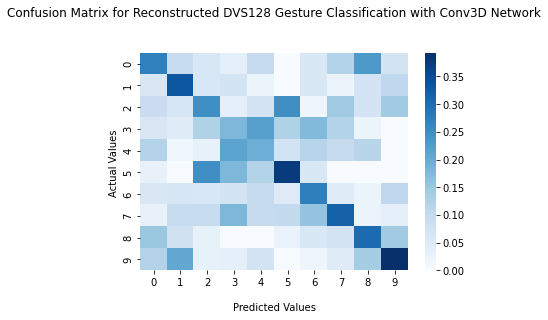

In [ ]:
from sklearn.metrics import confusion_matrix
import numpy as np
from keras.utils import np_utils
import seaborn as sns

#Create confusion matrix and normalizes it over predicted (columns)
result = confusion_matrix(testing_labels, y_pred.argmax(axis=1), normalize='pred')

ax = sns.heatmap(result, annot=False, cmap='Blues')

ax.set_title('Confusion Matrix for Reconstructed DVS128 Gesture Classification with Conv3D Network\n\n');
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels([i for i in range(12)])
ax.yaxis.set_ticklabels([i for i in range(12)])

### Custom LTSM Network 1

In [ ]:
from keras.layers import Conv2D, MaxPooling2D, Flatten

def build_convnet(shape=(34, 34, 1)):
  model = Sequential()
  model.add(Conv2D(128, (2,2), padding='same', input_shape=shape))
  model.add(Activation('relu'))

  model.add(MaxPooling2D(pool_size=(2,2)))

  model.add(Conv2D(256, (2,2), padding='same'))
  model.add(Activation('relu'))

  model.add(MaxPooling2D(pool_size=(2,2)))

  model.add(Conv2D(512, (2,2), padding='same'))
  model.add(Activation('relu'))

  model.add(MaxPooling2D(pool_size=(2,2)))

  # model.add(Conv2D(64, (9,9), padding='same'))
  # model.add(Activation('relu'))

  # model.add(MaxPooling2D(pool_size=(2,2)))

  model.add(Flatten())

  # model.add(Dense(512))
  # model.add(Activation('relu'))
  return model

In [ ]:
from keras.layers.core import Dense, Activation, Dropout
from keras.layers.recurrent import LSTM
from keras.models import Sequential
from keras.layers import TimeDistributed, GRU

def action_model(shape=(20, 34, 34, 1), nbout=10):
    # Create our convnet with (34, 34, 1) input shape
    print("done")
    convnet = build_convnet(shape[1:])

    # then create our final model
    model = Sequential()
    # add the convnet with (8, 34, 34, 1) shape
    model.add(TimeDistributed(convnet, input_shape=shape))
    # here, you can also use GRU or LSTM
    model.add(GRU(64))
    # and finally, we make a decision network
    model.add(Dense(1024, activation='relu'))
    model.add(Dropout(.5))
    model.add(Dense(512, activation='relu'))
    model.add(Dropout(.5))
    model.add(Dense(128, activation='relu'))
    model.add(Dropout(.5))
    model.add(Dense(64, activation='relu'))
    model.add(Dense(nbout, activation='softmax'))
    return model

In [ ]:
from keras.callbacks import EarlyStopping
from keras.callbacks import TensorBoard
import keras
from sklearn.model_selection import train_test_split
from tensorflow.keras.optimizers import Adam

batch_size = 1
nb_epoch = 120

model = action_model((67, 128, 128, 1), 10)
opt = Adam(lr=0.0001, decay=1e-6)

model.summary()

opt=Adam(lr=0.001)

# Compile the model
model.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])

early_stopping = EarlyStopping(monitor='val_accuracy', patience=8, restore_best_weights=True)

hist = model.fit(x=my_training_batch_generator, validation_data=my_validation_batch_generator,
          epochs=nb_epoch, batch_size=batch_size, shuffle=True, verbose=1, callbacks=[early_stopping])

done
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 time_distributed (TimeDistr  (None, 67, 131072)       656768    
 ibuted)                                                         
                                                                 
 gru (GRU)                   (None, 64)                25178496  
                                                                 
 dense (Dense)               (None, 1024)              66560     
                                                                 
 dropout (Dropout)           (None, 1024)              0         
                                                                 
 dense_1 (Dense)             (None, 512)               524800    
                                                                 
 dropout_1 (Dropout)         (None, 512)               0         
                                                 

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/120


In [ ]:
from keras.models import load_model

model.save('/content/drive/MyDrive/models/custom_conv_lstm_nmnist_recon.h5')  # creates a HDF5 file 'my_model.h5'
# del model  # deletes the existing model

#### Results

In [ ]:
from keras.models import load_model

model = load_model('/content/drive/MyDrive/models/custom_conv_lstm_nmnist_recon.h5')

In [ ]:
score = model.evaluate(x_test, y_test, verbose=0)
y_pred = model.predict(x_test)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

Test loss: 0.6526700258255005
Test accuracy: 0.8320000171661377


In [ ]:
from sklearn.metrics import classification_report

print(classification_report(y_test.argmax(axis=1), y_pred.argmax(axis=1)))

              precision    recall  f1-score   support

           0       0.88      0.95      0.91        75
           1       0.99      0.92      0.95        75
           2       0.93      0.85      0.89        75
           3       0.79      0.76      0.78        75
           4       0.96      0.73      0.83        75
           5       0.71      0.81      0.76        75
           6       0.81      0.92      0.86        75
           7       0.82      0.84      0.83        75
           8       0.68      0.68      0.68        75
           9       0.82      0.85      0.84        75

    accuracy                           0.83       750
   macro avg       0.84      0.83      0.83       750
weighted avg       0.84      0.83      0.83       750



[Text(0, 0.5, '0'),
 Text(0, 1.5, '1'),
 Text(0, 2.5, '2'),
 Text(0, 3.5, '3'),
 Text(0, 4.5, '4'),
 Text(0, 5.5, '5'),
 Text(0, 6.5, '6'),
 Text(0, 7.5, '7'),
 Text(0, 8.5, '8'),
 Text(0, 9.5, '9')]

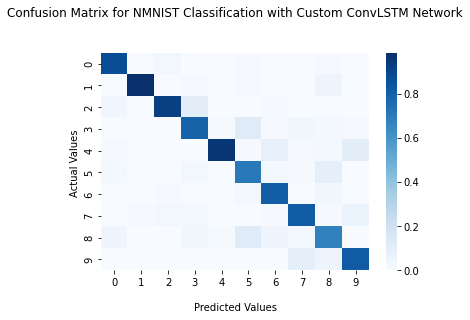

In [ ]:
from sklearn.metrics import confusion_matrix
import numpy as np
from keras.utils import np_utils
import seaborn as sns

#Create confusion matrix and normalizes it over predicted (columns)
result = confusion_matrix(y_test.argmax(axis=1), y_pred.argmax(axis=1), normalize='pred')

ax = sns.heatmap(result, annot=False, cmap='Blues')

ax.set_title('Confusion Matrix for NMNIST Classification with Custom ConvLSTM Network\n\n');
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels([i for i in range(10)])
ax.yaxis.set_ticklabels([i for i in range(10)])

# For Presentation

In [ ]:
import zipfile
from keras.utils import np_utils

!wget -O "MNIST_testing.zip" "https://data.mendeley.com/public-files/datasets/468j46mzdv/files/05a4d654-7e03-4c15-bdfa-9bb2bcbea494/file_downloaded"
with zipfile.ZipFile("MNIST_testing.zip", 'r') as zip_ref:
    zip_ref.extractall("/content/NMNIST")
!rm "MNIST_testing.zip"
!wget -O "MNIST_training.zip" "https://data.mendeley.com/public-files/datasets/468j46mzdv/files/39c25547-014b-4137-a934-9d29fa53c7a0/file_downloaded"
with zipfile.ZipFile("MNIST_training.zip", 'r') as zip_ref:
    zip_ref.extractall("/content/NMNIST")
!rm "MNIST_training.zip"

import os
import matplotlib.pyplot as plt
import numpy as np

max_no = 10000/20

!mkdir /content/tmp

frames = []
dir = "/content/NMNIST/Train/6/01270.bin"
events = read_events(dir)
max_x = 33
max_y = 33
segmented_events = segment_events(events, 8, False)
for segment in segmented_events:
  intensity_map = np.array(get_intensity(segment, max_x, max_y))
  intensity_map += 6
  # print(intensity_map.min())
  # print(intensity_map.max())
  plt.imshow(intensity_map, vmin=0, vmax=10, cmap='gray')
  plt.axis('off')
  plt.savefig('tmp.png', bbox_inches='tight', pad_inches=0)
  frames.append(Image.open("/content/tmp.png"))

# Save into a GIF file that loops forever
frames[0].save('nmnist_train_6_01270_custom_frame_integrated.gif', format='GIF',
               append_images=frames[1:],
               save_all=True,
               duration=300, loop=0)

--2022-06-25 14:53:09--  https://data.mendeley.com/public-files/datasets/468j46mzdv/files/05a4d654-7e03-4c15-bdfa-9bb2bcbea494/file_downloaded
Resolving data.mendeley.com (data.mendeley.com)... 162.159.133.86, 162.159.130.86
Connecting to data.mendeley.com (data.mendeley.com)|162.159.133.86|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://md-datasets-public-files-prod.s3.eu-west-1.amazonaws.com/a99d0fee-a95b-4231-ad22-988fdb0a2411 [following]
--2022-06-25 14:53:10--  https://md-datasets-public-files-prod.s3.eu-west-1.amazonaws.com/a99d0fee-a95b-4231-ad22-988fdb0a2411
Resolving md-datasets-public-files-prod.s3.eu-west-1.amazonaws.com (md-datasets-public-files-prod.s3.eu-west-1.amazonaws.com)... 52.218.85.27
Connecting to md-datasets-public-files-prod.s3.eu-west-1.amazonaws.com (md-datasets-public-files-prod.s3.eu-west-1.amazonaws.com)|52.218.85.27|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 169674850 (162M) [application

In [ ]:
!rm -rf /content/datasets
!mkdir /content/datasets
!mkdir /content/datasets/DVS128Gesture
!mkdir /content/datasets/DVS128Gesture/frames_number_20_split_by_number
!unzip -q /content/drive/MyDrive/DVS128Gesture/DVS128Gesture.zip -d /content/datasets/DVS128Gesture/frames_number_20_split_by_number
!cp /content/drive/MyDrive/DVS128Gesture/DVS_train.pkl /content/DVS_train.pkl
!cp /content/drive/MyDrive/DVS128Gesture/DVS_test.pkl /content/DVS_test.pkl

import pickle
!pip -q install spikingjelly
from spikingjelly.datasets.dvs128_gesture import DVS128Gesture

open_file = open("/content/DVS_train.pkl", "rb")
train_set = pickle.load(open_file)
open_file.close()

open_file = open("/content/DVS_test.pkl", "rb")
test_set = pickle.load(open_file)
open_file.close()

OSError: ignored

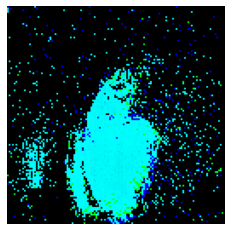

In [ ]:
import torch
from torchvision import transforms
from matplotlib import pyplot as plt
from PIL import Image

x, y = train_set[600]
to_img = transforms.ToPILImage()

img_tensor = torch.zeros([x.shape[0], 3, x.shape[2], x.shape[3]])
img_tensor[:, 1] = torch.from_numpy(x)[:, 0]
img_tensor[:, 2] = torch.from_numpy(x)[:, 1]

frames = []
for t in range(img_tensor.shape[0]):
    plt.imshow(to_img(img_tensor[t]))
    plt.axis('off')
    # plt.show()
    plt.savefig('tmp.png', bbox_inches='tight', pad_inches=0)
    # plt.savefig("tmp_{0}.png".format(t), bbox_inches='tight', pad_inches=0)
    frames.append(Image.open("/content/tmp.png"))

# Save into a GIF file that loops forever
frames[0].save('dvs128_train_600_frame_integrated.gif', format='GIF',
               append_images=frames[1:],
               save_all=True,
               duration=300, loop=0)

In [ ]:
from PIL import Image
frames = []
for i in range(20):
  frames.append(Image.open("/content/tmp_{0}.png".format(i)))

# Save into a GIF file that loops forever
frames[0].save('dvs128_train_600_frame_integrated.gif', format='GIF',
               append_images=frames[1:],
               save_all=True,
               duration=300, loop=0)

In [ ]:
x, y = train_set[600]
print(y)

6
